In [3]:
from matplotlib import pyplot as plt
# from superlet import superlet, scale_from_period
import mne 
from mne import create_info
import numpy as np
from burst_detection import extract_bursts
from fooof import FOOOF
from autoreject import AutoReject
import scipy

import pandas as pd
from matplotlib import ticker
from sklearn.decomposition import PCA
from sklearn.preprocessing import RobustScaler
import seaborn as sns

from scipy.stats import pearsonr
from mpl_toolkits.axes_grid1 import make_axes_locatable


In [4]:
def many_is_in(multiple, target):
    check_ = []
    for i in multiple:
        check_.append(i in target)
    return any(check_)

In [5]:
import numpy as np
from scipy.ndimage import gaussian_filter1d

def calculate_burst_rates(df_burst, exp, condition, electrode, epoch, time_bin=0.05, time_buffer=0.125):
    # Define the time range
    time_range = np.arange(-1 - time_buffer, 2 + time_buffer, time_bin)
    
    # Find the closest indices to -1 and 0 in the time_range array
    baseline_start = np.argmin(np.abs(time_range - (-0.5)))
    baseline_end = np.argmin(np.abs(time_range - (0)))

    # Filter the dataframe by 'exp' and 'condition'
    bursts = df_burst[(df_burst['experiment'] == exp) & 
                      (df_burst['condition'] == condition) & 
                      (df_burst['electrode'] == electrode) & 
                      (df_burst['epochs'] == epoch)]
    subjects = bursts['subject'].unique()

    # Create a list to store burst rates for each subject
    burst_rates = []

    for subject in subjects:
        # Initialize an array for burst rates for the current subject
        subject_burst_rates = np.zeros(len(time_range))

        subject_df = bursts[bursts['subject'] == subject]

        for i, t in enumerate(time_range):
            subject_burst_rates[i] = len(subject_df[(subject_df['peak_time'] >= t) & (subject_df['peak_time'] < t + time_bin)]) / time_bin

        subject_burst_rates_smoothed = gaussian_filter1d(subject_burst_rates, sigma=1)

        # baseline correction
        baseline_mean = np.mean(subject_burst_rates_smoothed[baseline_start:baseline_end])
        subject_burst_rates_smoothed = ((subject_burst_rates_smoothed - baseline_mean) / baseline_mean) * 100
        
        # Append the smoothed burst rates for the current subject to the list
        burst_rates.append(subject_burst_rates_smoothed)

    return burst_rates

In [6]:
path = '/Users/quentinmoreau/Documents/Work/schmidt_bursts/bursts_exp1'

# combine bursts_all_results and bursts_all_results_cue
bursts_all_results_laplac = np.load(f'{path}/bursts_all_results_laplac.npy', allow_pickle=True)
waveform_times_laplac = np.load(f'{path}/waveform_times.npy')

In [7]:
bursts_C3 = [burst for burst in bursts_all_results_laplac if burst['electrode'][0] == 'C3']
bursts_F4 = [burst for burst in bursts_all_results_laplac if burst['electrode'][0] == 'F4']

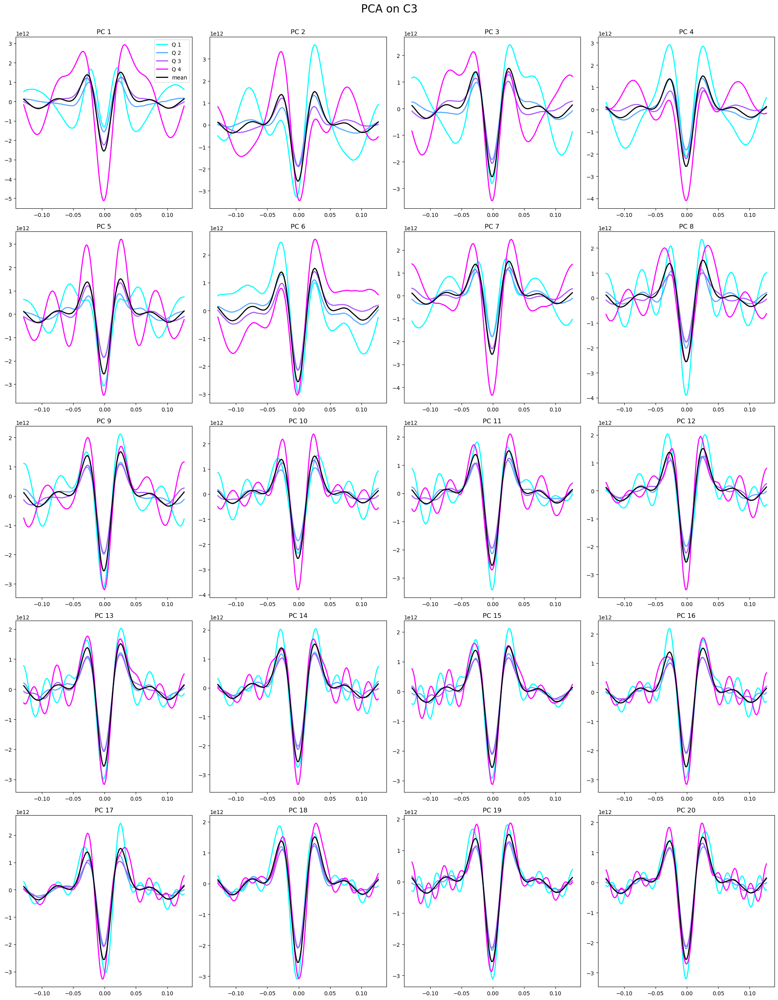

In [8]:
# Creating the dictionary and stacking waveforms
dict_output_laplac_C3 = {i: [] for i in bursts_C3[0].keys() if not many_is_in(["waveform", "waveform_times"], i)}
waveforms_laplac_C3 = []

for b in bursts_C3:
    [dict_output_laplac_C3[k].append(b[k]) for k in dict_output_laplac_C3.keys()]
    waveforms_laplac_C3.append(b["waveform"])

for i in dict_output_laplac_C3.keys():
    dict_output_laplac_C3[i] = np.hstack(dict_output_laplac_C3[i])
waveforms_laplac_C3 = np.vstack([i for i in waveforms_laplac_C3 if i.shape[0] > 0])  # all the bursts x time

# Scaling and PCA on the entire dataset
model_laplac_C3 = PCA(n_components=20)
scaler_laplac_C3 = RobustScaler().fit(waveforms_laplac_C3)
model_laplac_C3.fit(scaler_laplac_C3.transform(waveforms_laplac_C3))
burst_std = scaler_laplac_C3.transform(waveforms_laplac_C3)

# Transforming the data to get principal components
pc_scores_laplac_C3 = model_laplac_C3.transform(burst_std)  # all the bursts x 20 components
pc_labels_laplac_C3 = ["PC_{}".format(i + 1) for i in range(pc_scores_laplac_C3.shape[1])]
pc_df_laplac_C3 = pd.DataFrame.from_dict({i: pc_scores_laplac_C3[:, ix] for ix, i in enumerate(pc_labels_laplac_C3)})
dict_output_df_laplac_C3 = pd.DataFrame.from_dict(dict_output_laplac_C3)
features_scores_laplac_C3 = pd.concat([dict_output_df_laplac_C3, pc_df_laplac_C3], axis=1)

# Quartile calculation
quartiles_laplac_C3 = np.linspace(0, 100, num=5)
quartiles_laplac_C3 = list(zip(quartiles_laplac_C3[:-1], quartiles_laplac_C3[1:]))
col_range_laplac_C3 = plt.cm.cool(np.linspace(0, 1, num=len(quartiles_laplac_C3)))
mean_waveform_laplac_C3 = np.mean(waveforms_laplac_C3, axis=0)

# Plotting the PCA results
f_laplac_C3, ax_laplac_C3 = plt.subplots(5, 4, figsize=(20, 25))
ax_laplac_C3 = ax_laplac_C3.flatten()
for pc_ix, pc in enumerate(pc_labels_laplac_C3):
    ax_laplac_C3[pc_ix].set_title(pc.replace("_", " "))  # Set the nice title
    scores_laplac_C3 = features_scores_laplac_C3[pc].values  # Select the appropriate principal component from the dataframe
    q_maps_laplac_C3 = []
    for q_ix, (b, e) in enumerate(quartiles_laplac_C3):
        q_map_laplac_C3 = (scores_laplac_C3 > np.percentile(scores_laplac_C3, b)) & (scores_laplac_C3 <= np.percentile(scores_laplac_C3, e))  # Create a boolean map to select the waveforms_laplac_C3
        q_mean_laplac_C3 = np.mean(waveforms_laplac_C3[q_map_laplac_C3], axis=0)
        ax_laplac_C3[pc_ix].plot(waveform_times_laplac, q_mean_laplac_C3 / 1e-15, lw=2, c=col_range_laplac_C3[q_ix], label="Q {}".format(q_ix + 1))
    ax_laplac_C3[pc_ix].plot(waveform_times_laplac, mean_waveform_laplac_C3 / 1e-15, lw=2, c="black", label="mean")
ax_laplac_C3[0].legend(fontsize=10)
plt.tight_layout()
plt.suptitle("PCA on C3", fontsize=20, y=1.02)
plt.show()


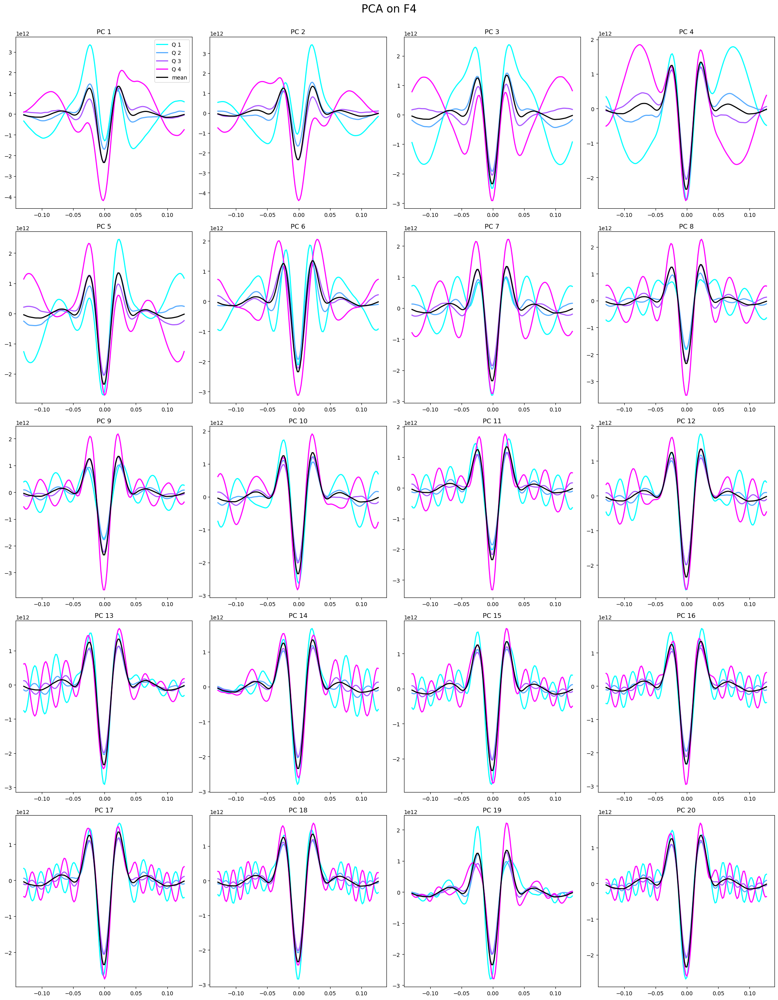

In [9]:
# Creating the dictionary and stacking waveforms
dict_output_laplac_F4 = {i: [] for i in bursts_F4[0].keys() if not many_is_in(["waveform", "waveform_times"], i)}
waveforms_laplac_F4 = []

for b in bursts_F4:
    [dict_output_laplac_F4[k].append(b[k]) for k in dict_output_laplac_F4.keys()]
    waveforms_laplac_F4.append(b["waveform"])

for i in dict_output_laplac_F4.keys():
    dict_output_laplac_F4[i] = np.hstack(dict_output_laplac_F4[i])
waveforms_laplac_F4 = np.vstack([i for i in waveforms_laplac_F4 if i.shape[0] > 0])  # all the bursts x time

# Scaling and PCA on the entire dataset
model_laplac_F4 = PCA(n_components=20)
scaler_laplac_F4 = RobustScaler().fit(waveforms_laplac_F4)
model_laplac_F4.fit(scaler_laplac_F4.transform(waveforms_laplac_F4))
burst_std = scaler_laplac_F4.transform(waveforms_laplac_F4)

# Transforming the data to get principal components
pc_scores_laplac_F4 = model_laplac_F4.transform(burst_std)  # all the bursts x 20 components
pc_labels_laplac_F4 = ["PC_{}".format(i + 1) for i in range(pc_scores_laplac_F4.shape[1])]
pc_df_laplac_F4 = pd.DataFrame.from_dict({i: pc_scores_laplac_F4[:, ix] for ix, i in enumerate(pc_labels_laplac_F4)})
dict_output_df_laplac_F4 = pd.DataFrame.from_dict(dict_output_laplac_F4)
features_scores_laplac_F4 = pd.concat([dict_output_df_laplac_F4, pc_df_laplac_F4], axis=1)

# Quartile calculation
quartiles_laplac_F4 = np.linspace(0, 100, num=5)
quartiles_laplac_F4 = list(zip(quartiles_laplac_F4[:-1], quartiles_laplac_F4[1:]))
col_range_laplac_F4 = plt.cm.cool(np.linspace(0, 1, num=len(quartiles_laplac_F4)))
mean_waveform_laplac_F4 = np.mean(waveforms_laplac_F4, axis=0)

# Plotting the PCA results
f_laplac_F4, ax_laplac_F4 = plt.subplots(5, 4, figsize=(20, 25))
ax_laplac_F4 = ax_laplac_F4.flatten()
for pc_ix, pc in enumerate(pc_labels_laplac_F4):
    ax_laplac_F4[pc_ix].set_title(pc.replace("_", " "))  # Set the nice title
    scores_laplac_F4 = features_scores_laplac_F4[pc].values  # Select the appropriate principal component from the dataframe
    q_maps_laplac_F4 = []
    for q_ix, (b, e) in enumerate(quartiles_laplac_F4):
        q_map_laplac_F4 = (scores_laplac_F4 > np.percentile(scores_laplac_F4, b)) & (scores_laplac_F4 <= np.percentile(scores_laplac_F4, e))  # Create a boolean map to select the waveforms_laplac_F4
        q_mean_laplac_F4 = np.mean(waveforms_laplac_F4[q_map_laplac_F4], axis=0)
        ax_laplac_F4[pc_ix].plot(waveform_times_laplac, q_mean_laplac_F4 / 1e-15, lw=2, c=col_range_laplac_F4[q_ix], label="Q {}".format(q_ix + 1))
    ax_laplac_F4[pc_ix].plot(waveform_times_laplac, mean_waveform_laplac_F4 / 1e-15, lw=2, c="black", label="mean")
ax_laplac_F4[0].legend(fontsize=10)
plt.tight_layout()
plt.suptitle("PCA on F4", fontsize=20, y=1.02)
plt.show()


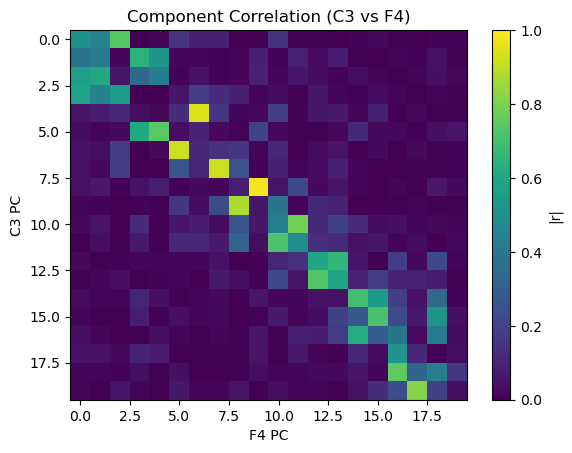

In [10]:
from scipy.stats import pearsonr, spearmanr
import matplotlib.pyplot as plt
import numpy as np

# Parameters
pcs_to_analyze_c = 20
min_pcs = min(model_laplac_C3.components_.shape[0], model_laplac_F4.components_.shape[0])

# Calculate the component correlation matrix
comp_corrmat_C3_F4 = np.zeros((min_pcs, min_pcs))
for i in range(min_pcs):
    for j in range(min_pcs):
        comp_corrmat_C3_F4[i, j] = np.abs(spearmanr(model_laplac_C3.components_[i, :], model_laplac_F4.components_[j, :])[0])

# Plot the correlation matrix
plt.imshow(comp_corrmat_C3_F4, aspect='auto', origin='upper', cmap='viridis', vmin=0, vmax=1)
plt.colorbar(label='|r|')
plt.xlabel('F4 PC')
plt.ylabel('C3 PC')
plt.title('Component Correlation (C3 vs F4)')
plt.show()


In [11]:
#using dict_output_laplac_C3 and waveforms_laplac_C3, create a dataframe with mean waveform for each subject

import numpy as np

# Initialize an empty list to store the mean waveforms
mean_waveforms_laplac_C3 = []

# Loop through unique subjects in the dictionary
unique_subjects = np.unique(dict_output_laplac_C3['subject'])
for subject in unique_subjects:
    # Extract waveforms corresponding to the current subject
    print(subject)
    subject_waveforms = waveforms_laplac_C3[dict_output_laplac_C3['subject'] == subject]
    
    # Calculate the mean waveform for the subject
    mean_waveform = np.mean(subject_waveforms, axis=0)
    
    # Append the mean waveform to the list
    mean_waveforms_laplac_C3.append(mean_waveform)

# Convert the list to a NumPy array
matrix_mean_waveforms_laplac_C3 = np.array(mean_waveforms_laplac_C3)

matrix_mean_waveforms_laplac_C3.shape



S1
S10
S11
S13
S14
S15
S2
S3
S5
S6
S7
S8


(12, 132)

In [12]:
#using dict_output_laplac_F4 and waveforms_laplac_F4, create a dataframe with mean waveform for each subject

import numpy as np

# Initialize an empty list to store the mean waveforms
mean_waveforms_laplac_F4 = []

# Loop through unique subjects in the dictionary
unique_subjects = np.unique(dict_output_laplac_F4['subject'])
for subject in unique_subjects:
    # Extract waveforms corresponding to the current subject
    print(subject)
    subject_waveforms = waveforms_laplac_F4[dict_output_laplac_F4['subject'] == subject]
    
    # Calculate the mean waveform for the subject
    mean_waveform = np.mean(subject_waveforms, axis=0)
    
    # Append the mean waveform to the list
    mean_waveforms_laplac_F4.append(mean_waveform)

# Convert the list to a NumPy array
matrix_mean_waveforms_laplac_F4 = np.array(mean_waveforms_laplac_F4)

matrix_mean_waveforms_laplac_F4.shape



S1
S10
S11
S13
S14
S15
S2
S3
S5
S6
S7
S8


(12, 132)

Using a threshold of 2.200985
stat_fun(H1): min=-3.782782 max=3.706649
Running initial clustering …
Found 8 clusters


  0%|          | Permuting : 0/999 [00:00<?,       ?it/s]

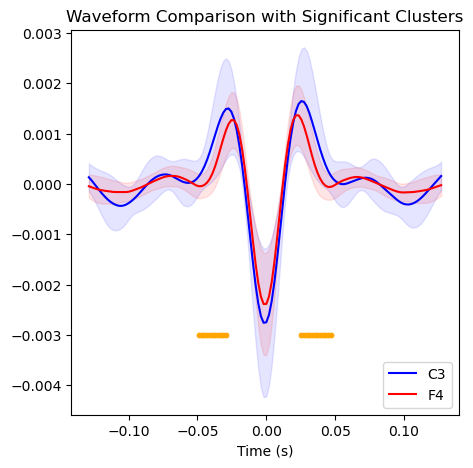

In [13]:
from scipy.stats import sem

data = matrix_mean_waveforms_laplac_C3 - matrix_mean_waveforms_laplac_F4

# Perform cluster-based permutation test
T_obs, clusters, cluster_p_values, H0 = mne.stats.permutation_cluster_1samp_test(
    data, n_permutations=1000
)

# Plotting
fig, ax = plt.subplots(1, 1, figsize=(5, 5))

# Plot mean waveforms
ax.plot(
    waveform_times_laplac,
    np.mean(matrix_mean_waveforms_laplac_C3, axis=0),
    label="C3",
    color="blue",
)
ax.plot(
    waveform_times_laplac,
    np.mean(matrix_mean_waveforms_laplac_F4, axis=0),
    label="F4",
    color="red",
)

# Add shaded area using SEM around the mean waveform
ax.fill_between(
    waveform_times_laplac,
    np.mean(matrix_mean_waveforms_laplac_C3, axis=0) - np.std(matrix_mean_waveforms_laplac_C3, axis=0),
    np.mean(matrix_mean_waveforms_laplac_C3, axis=0) + np.std(matrix_mean_waveforms_laplac_C3, axis=0),
    color="blue",
    alpha=0.1,
)
ax.fill_between(
    waveform_times_laplac,
    np.mean(matrix_mean_waveforms_laplac_F4, axis=0) - np.std(matrix_mean_waveforms_laplac_F4, axis=0),
    np.mean(matrix_mean_waveforms_laplac_F4, axis=0) + np.std(matrix_mean_waveforms_laplac_F4, axis=0),
    color="red",
    alpha=0.1,
)

# Plot significant clusters as dots
for i_c, c in enumerate(clusters):
    c = c[0]
    if cluster_p_values[i_c] < 0.05:
        # Add dots at the time points of the cluster
        cluster_times = waveform_times_laplac[c]
        cluster_midpoint = -0.003  # Midpoint between the offsets for clarity
        ax.scatter(cluster_times, [cluster_midpoint] * len(cluster_times), color='orange', label='Significant Cluster' if i_c == 0 else "", s=10)

# Finalize plot

ax.set_xlabel("Time (s)")
ax.set_title("Waveform Comparison with Significant Clusters")
ax.legend(loc='lower right')
plt.show()


/var/folders/6s/2qfkp2515r7f660tnsjg8t440000gq/T/ipykernel_35436/3659843304.py:37: RuntimeWarning: Mean of empty slice
  bin_means_across_subjects = np.nanmean(all_sub_ts,axis=0)
/Users/quentinmoreau/opt/anaconda3/envs/mne/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


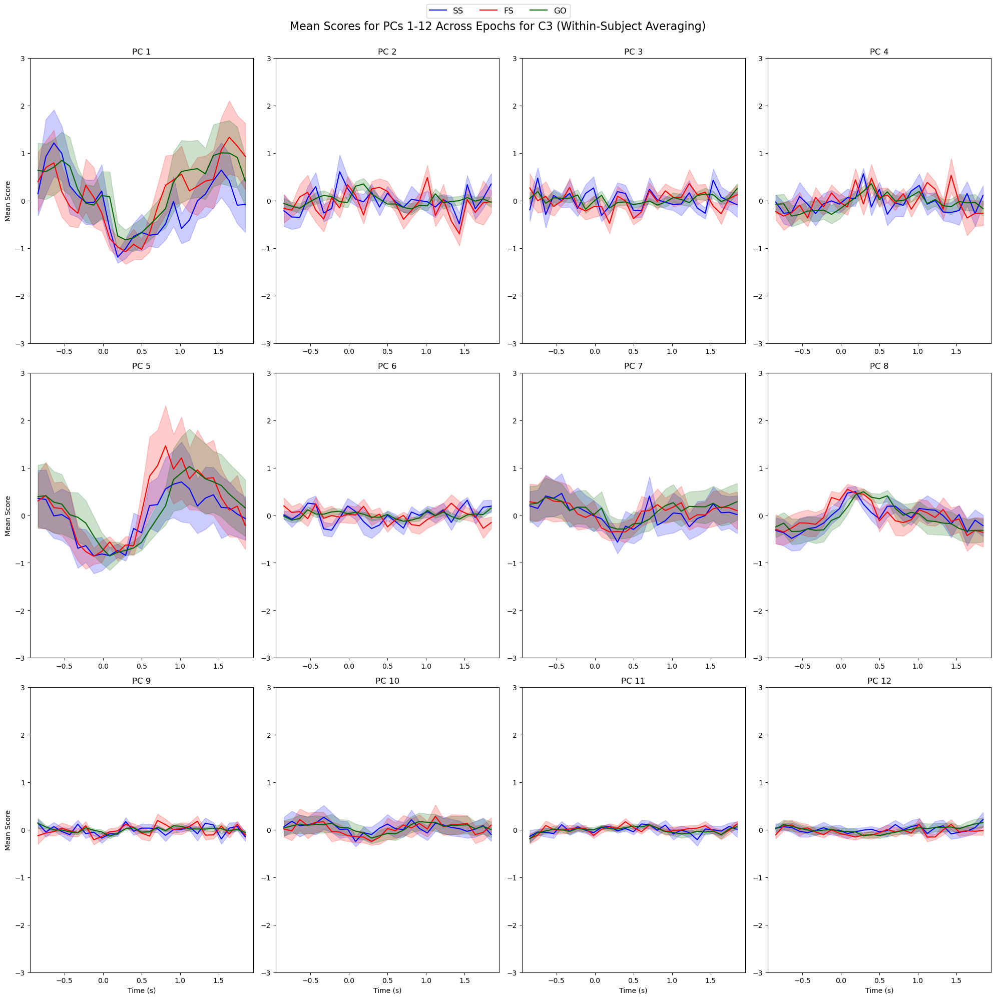

In [14]:
# Define epoch types
epoch_types = ["SS", "FS", "GO"]
colors = ["blue", "red", "darkgreen"]  # Colors for epoch types

# Define time bins
time_bins = np.linspace(-1, 2, num=30)  # Time range from -1 to 2 seconds
bin_centers = (time_bins[:-1] + time_bins[1:]) / 2  # Bin centers for plotting

# Create subplots for all PCs
n_pcs = 12
fig, axs = plt.subplots(3, 4, figsize=(20, 20))  # 3 rows, 4 columns for 12 PCs
axs = axs.flatten()

for pc_ix in range(n_pcs):

    ax = axs[pc_ix]
    
    for ep in epoch_types:

        all_sub_ts=[]
        for subject in np.unique(dict_output_laplac_C3['subject']):

            subject_ts=[]
            # Loop through bins
            for start, end in zip(time_bins[:-1], time_bins[1:]):
                burst_idx = (dict_output_laplac_C3['condition']==ep) & (dict_output_laplac_C3['subject']==subject) & (dict_output_laplac_C3['peak_time']>=start)  & (dict_output_laplac_C3['peak_time']<=end)

                if np.any(burst_idx):
                    burst_scores = pc_scores_laplac_C3[burst_idx,pc_ix]
                    subject_ts.append(np.mean(burst_scores))
                else:
                    subject_ts.append(np.nan)
            all_sub_ts.append(subject_ts)
        
        # Plot mean ± SEM for the current epoch type
        all_sub_ts = np.array(all_sub_ts)
        bin_means_across_subjects = np.nanmean(all_sub_ts,axis=0)
        bin_sems_across_subjects = np.nanstd(all_sub_ts,axis=0)/np.sqrt(all_sub_ts.shape[0])
        ax.plot(bin_centers, bin_means_across_subjects, label=f"{ep}", color=colors[epoch_types.index(ep)])
        ax.fill_between(
            bin_centers,
            bin_means_across_subjects - bin_sems_across_subjects,
            bin_means_across_subjects + bin_sems_across_subjects,
            alpha=0.2,
            color=colors[epoch_types.index(ep)]
        )

    # Add labels and title
    ax.set_title(f"PC {pc_ix + 1}")
    ax.set_xlim(bin_centers[0], bin_centers[-1])
    ax.set_ylim(-3, 3)
    if pc_ix % 4 == 0:
        ax.set_ylabel("Mean Score")
    if pc_ix >= 8:
        ax.set_xlabel("Time (s)")

# Add a legend
handles, labels = axs[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', ncol=3, fontsize=12)

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout to fit the legend
plt.suptitle("Mean Scores for PCs 1-12 Across Epochs for C3 (Within-Subject Averaging)", fontsize=16)
plt.show()


/var/folders/6s/2qfkp2515r7f660tnsjg8t440000gq/T/ipykernel_35436/377725193.py:37: RuntimeWarning: Mean of empty slice
  bin_means_across_subjects = np.nanmean(all_sub_ts,axis=0)


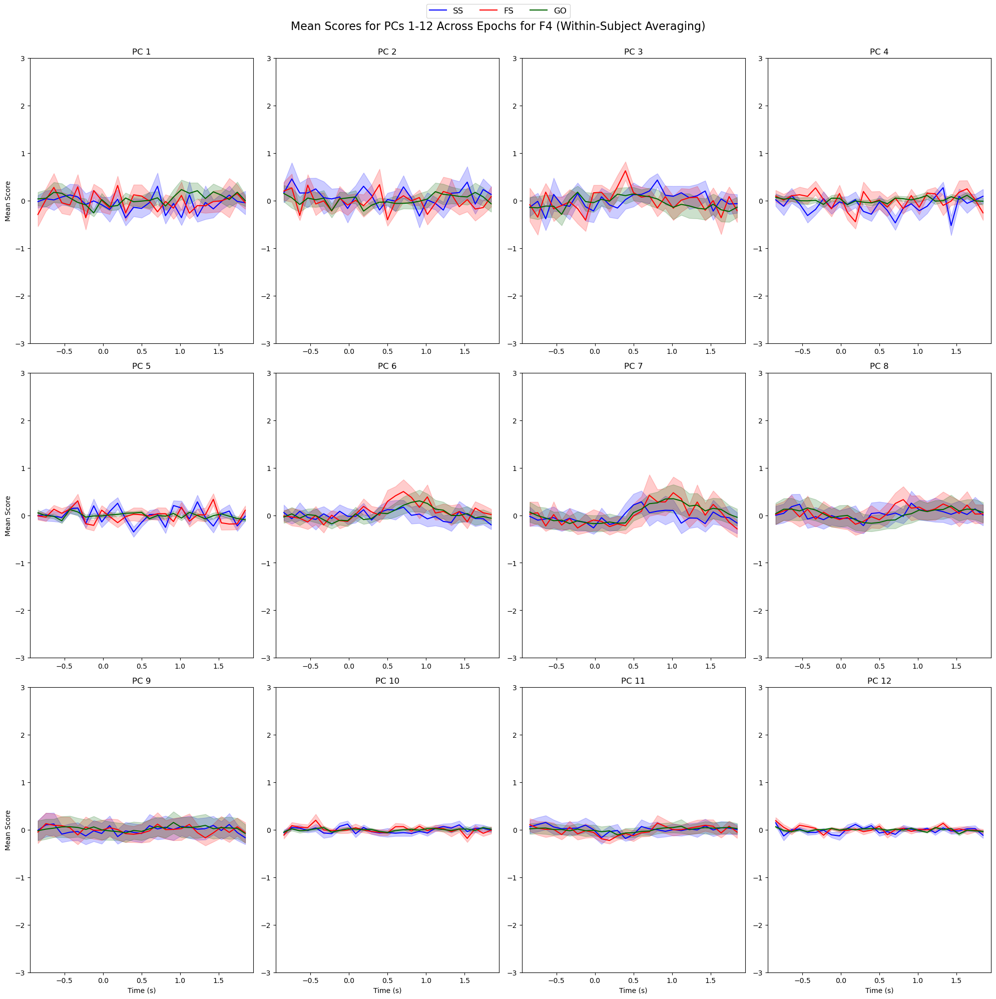

In [15]:
# Define epoch types
epoch_types = ["SS", "FS", "GO"]
colors = ["blue", "red", "darkgreen"]  # Colors for epoch types

# Define time bins
time_bins = np.linspace(-1, 2, num=30)  # Time range from -1 to 2 seconds
bin_centers = (time_bins[:-1] + time_bins[1:]) / 2  # Bin centers for plotting

# Create subplots for all PCs
n_pcs = 12
fig, axs = plt.subplots(3, 4, figsize=(20, 20))  # 3 rows, 4 columns for 12 PCs
axs = axs.flatten()

for pc_ix in range(n_pcs):

    ax = axs[pc_ix]
    
    for ep in epoch_types:

        all_sub_ts=[]
        for subject in np.unique(dict_output_laplac_F4['subject']):

            subject_ts=[]
            # Loop through bins
            for start, end in zip(time_bins[:-1], time_bins[1:]):
                burst_idx = (dict_output_laplac_F4['condition']==ep) & (dict_output_laplac_F4['subject']==subject) & (dict_output_laplac_F4['peak_time']>=start)  & (dict_output_laplac_F4['peak_time']<=end)

                if np.any(burst_idx):
                    burst_scores = pc_scores_laplac_F4[burst_idx,pc_ix]
                    subject_ts.append(np.mean(burst_scores))
                else:
                    subject_ts.append(np.nan)
            all_sub_ts.append(subject_ts)
        
        # Plot mean ± SEM for the current epoch type
        all_sub_ts = np.array(all_sub_ts)
        bin_means_across_subjects = np.nanmean(all_sub_ts,axis=0)
        bin_sems_across_subjects = np.nanstd(all_sub_ts,axis=0)/np.sqrt(all_sub_ts.shape[0])
        ax.plot(bin_centers, bin_means_across_subjects, label=f"{ep}", color=colors[epoch_types.index(ep)])
        ax.fill_between(
            bin_centers,
            bin_means_across_subjects - bin_sems_across_subjects,
            bin_means_across_subjects + bin_sems_across_subjects,
            alpha=0.2,
            color=colors[epoch_types.index(ep)]
        )

    # Add labels and title
    ax.set_title(f"PC {pc_ix + 1}")
    ax.set_xlim(bin_centers[0], bin_centers[-1])
    ax.set_ylim(-3, 3)
    if pc_ix % 4 == 0:
        ax.set_ylabel("Mean Score")
    if pc_ix >= 8:
        ax.set_xlabel("Time (s)")

# Add a legend
handles, labels = axs[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', ncol=3, fontsize=12)

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout to fit the legend
plt.suptitle("Mean Scores for PCs 1-12 Across Epochs for F4 (Within-Subject Averaging)", fontsize=16)
plt.show()


/var/folders/6s/2qfkp2515r7f660tnsjg8t440000gq/T/ipykernel_35436/557933857.py:35: RuntimeWarning: Mean of empty slice
  bin_means_across_subjects = np.nanmean(all_sub_ts, axis=0)


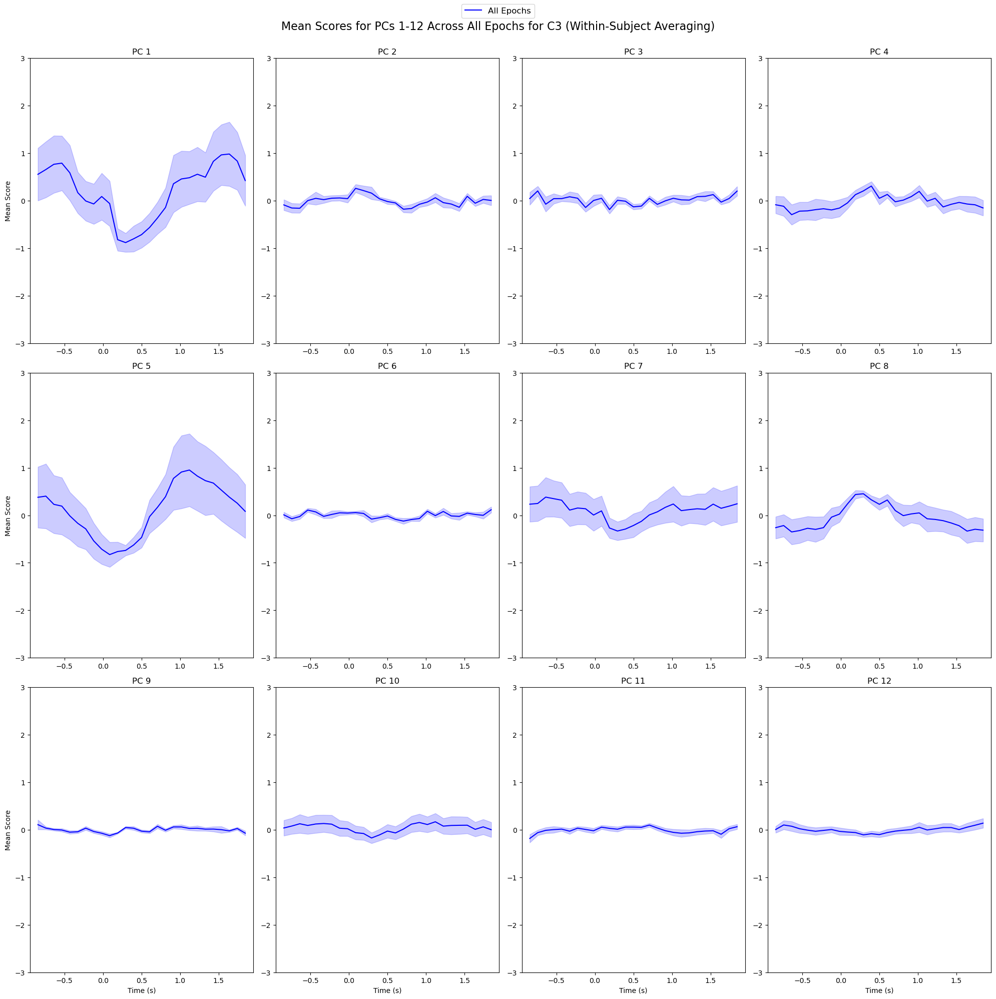

In [16]:
# Define time bins
time_bins = np.linspace(-1, 2, num=30)  # Time range from -1 to 2 seconds
bin_centers = (time_bins[:-1] + time_bins[1:]) / 2  # Bin centers for plotting
var_mean_C3 = np.zeros((pc_scores_laplac_C3.shape[1], len(bin_centers)))

# Create subplots for all PCs
n_pcs = 12
fig, axs = plt.subplots(3, 4, figsize=(20, 20))  # 3 rows, 4 columns for 12 PCs
axs = axs.flatten()

for pc_ix in range(n_pcs):

    ax = axs[pc_ix]
    
    all_sub_ts = []
    for subject in np.unique(dict_output_laplac_C3['subject']):

        subject_ts = []
        # Loop through bins
        for start, end in zip(time_bins[:-1], time_bins[1:]):
            # Aggregate all conditions (SS, FS, GO)
            burst_idx = (dict_output_laplac_C3['peak_time'] >= start) & \
                        (dict_output_laplac_C3['peak_time'] <= end) & \
                        (dict_output_laplac_C3['subject'] == subject)

            if np.any(burst_idx):
                burst_scores = pc_scores_laplac_C3[burst_idx, pc_ix]
                subject_ts.append(np.mean(burst_scores))
            else:
                subject_ts.append(np.nan)
        all_sub_ts.append(subject_ts)

    # Plot mean ± SEM across all subjects and epochs
    all_sub_ts = np.array(all_sub_ts)
    bin_means_across_subjects = np.nanmean(all_sub_ts, axis=0)
    bin_sems_across_subjects = np.nanstd(all_sub_ts, axis=0) / np.sqrt(all_sub_ts.shape[0])
    ax.plot(bin_centers, bin_means_across_subjects, label="All Epochs", color="blue")
    ax.fill_between(
        bin_centers,
        bin_means_across_subjects - bin_sems_across_subjects,
        bin_means_across_subjects + bin_sems_across_subjects,
        alpha=0.2,
        color="blue"
    )

    # append variance
    var_mean_C3[pc_ix, :] = np.nanvar(bin_means_across_subjects)


    # Add labels and title
    ax.set_title(f"PC {pc_ix + 1}")
    ax.set_xlim(bin_centers[0], bin_centers[-1])
    ax.set_ylim(-3, 3)
    if pc_ix % 4 == 0:
        ax.set_ylabel("Mean Score")
    if pc_ix >= 8:
        ax.set_xlabel("Time (s)")

# Add a legend
handles, labels = axs[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', ncol=3, fontsize=12)

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout to fit the legend
plt.suptitle("Mean Scores for PCs 1-12 Across All Epochs for C3 (Within-Subject Averaging)", fontsize=16)
plt.show()


/var/folders/6s/2qfkp2515r7f660tnsjg8t440000gq/T/ipykernel_35436/836171524.py:35: RuntimeWarning: Mean of empty slice
  bin_means_across_subjects = np.nanmean(all_sub_ts, axis=0)


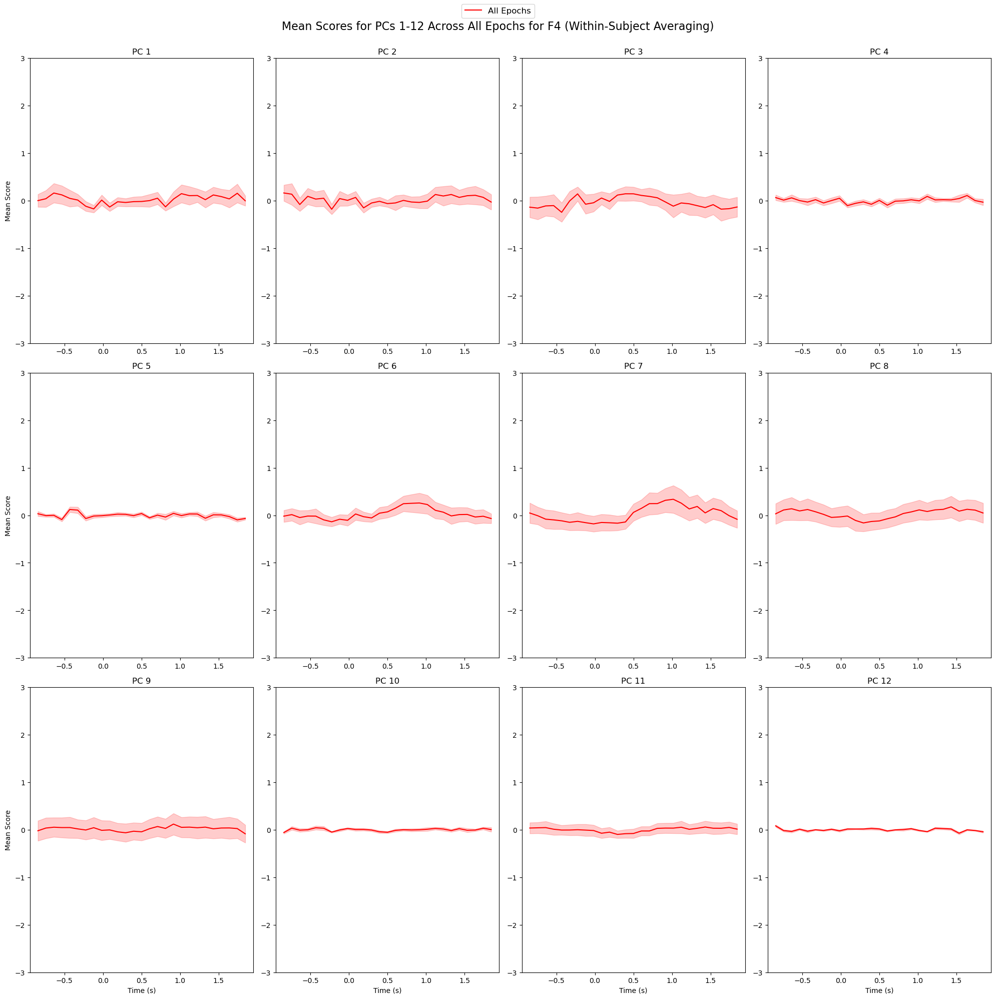

In [17]:
# Define time bins
time_bins = np.linspace(-1, 2, num=30)  # Time range from -1 to 2 seconds
bin_centers = (time_bins[:-1] + time_bins[1:]) / 2  # Bin centers for plotting
var_mean_F4 = np.zeros((pc_scores_laplac_F4.shape[1], len(bin_centers)))

# Create subplots for all PCs
n_pcs = 12
fig, axs = plt.subplots(3, 4, figsize=(20, 20))  # 3 rows, 4 columns for 12 PCs
axs = axs.flatten()

for pc_ix in range(n_pcs):

    ax = axs[pc_ix]
    
    all_sub_ts = []
    for subject in np.unique(dict_output_laplac_F4['subject']):

        subject_ts = []
        # Loop through bins
        for start, end in zip(time_bins[:-1], time_bins[1:]):
            # Aggregate all conditions (SS, FS, GO)
            burst_idx = (dict_output_laplac_F4['peak_time'] >= start) & \
                        (dict_output_laplac_F4['peak_time'] <= end) & \
                        (dict_output_laplac_F4['subject'] == subject)

            if np.any(burst_idx):
                burst_scores = pc_scores_laplac_F4[burst_idx, pc_ix]
                subject_ts.append(np.mean(burst_scores))
            else:
                subject_ts.append(np.nan)
        all_sub_ts.append(subject_ts)

    # Plot mean ± SEM across all subjects and epochs
    all_sub_ts = np.array(all_sub_ts)
    bin_means_across_subjects = np.nanmean(all_sub_ts, axis=0)
    bin_sems_across_subjects = np.nanstd(all_sub_ts, axis=0) / np.sqrt(all_sub_ts.shape[0])
    ax.plot(bin_centers, bin_means_across_subjects, label="All Epochs", color="red")
    ax.fill_between(
        bin_centers,
        bin_means_across_subjects - bin_sems_across_subjects,
        bin_means_across_subjects + bin_sems_across_subjects,
        alpha=0.2,
        color="red"
    )

    # append variance
    var_mean_F4[pc_ix, :] = np.nanvar(bin_means_across_subjects)

    # Add labels and title
    ax.set_title(f"PC {pc_ix + 1}")
    ax.set_xlim(bin_centers[0], bin_centers[-1])
    ax.set_ylim(-3, 3)
    if pc_ix % 4 == 0:
        ax.set_ylabel("Mean Score")
    if pc_ix >= 8:
        ax.set_xlabel("Time (s)")

# Add a legend
handles, labels = axs[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', ncol=3, fontsize=12)

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout to fit the legend
plt.suptitle("Mean Scores for PCs 1-12 Across All Epochs for F4 (Within-Subject Averaging)", fontsize=16)
plt.show()


In [18]:
def shuffle_array(array):
    X_array = array.copy()
    rows, columns = array.shape
    for col in range(columns):
        ixes = np.arange(0,rows)
        np.random.shuffle(ixes)
        X_array[:,col] = X_array[:,col][ixes]
    return X_array

def shuffle_array_range(array, ranges):
    X_array = []
    for x1, x2 in ranges:
        X = wvf[:,x1:x2]
        np.random.shuffle(X)
        X_array.append(X)
    return np.hstack(X_array)

def get_num_components(waveforms, n_comps):
    # robust scaling
    waveforms_scaled = RobustScaler().fit_transform(waveforms)

    # main PCA fitting
    pca_full = PCA(n_components=n_comps)
    pcs_full = pca_full.fit_transform(waveforms_scaled)
    var_full = pca_full.explained_variance_ratio_ 

    # robustness of pca components
    no_of_iter = 100
    pca_vars = []
    for i in range(no_of_iter):
        shuffled_wvf = shuffle_array(waveforms_scaled)

        pca_shuff = PCA(n_components=n_comps)
        pca_shuff.fit(shuffled_wvf)
        pca_vars.append(pca_shuff.explained_variance_ratio_)        
    del shuffled_wvf
    pca_vars=np.array(pca_vars)

    # getting the magic number
    results = np.sum(var_full>pca_vars, axis=0) / no_of_iter
    threshold=1-(.05/n_comps)
    PCS_to_analyse = np.where(results > threshold)[0]
    return PCS_to_analyse

In [19]:
shuffling_results_C3=get_num_components(waveforms_laplac_C3, 20)
print(f'Non-noise PCs: {shuffling_results_C3}')

Non-noise PCs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14]


In [20]:
shuffling_results_F4=get_num_components(waveforms_laplac_F4, 20)
print(f'Non-noise PCs: {shuffling_results_F4}')


Non-noise PCs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19]


In [21]:
var_mean_C3_avg = np.mean(var_mean_C3, axis=1)
var_mean_F4_avg = np.mean(var_mean_F4, axis=1)

In [22]:
model_laplac_C3.explained_variance_.shape

(20,)

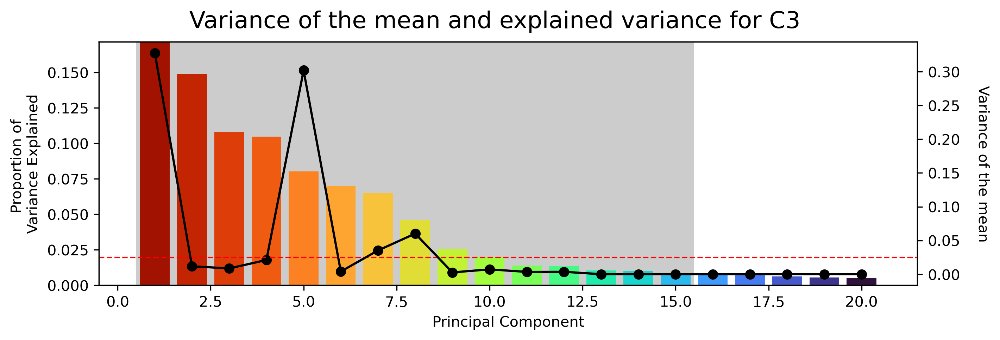

In [23]:
f, ax = plt.subplots(1, 1, figsize=(10,3), dpi=300, facecolor="white")
PC_var_exp = model_laplac_C3.explained_variance_ratio_
PC_r = np.arange(PC_var_exp.shape[0]) + 1
shuf_plot=np.zeros(PC_var_exp.shape[0])
shuf_plot[shuffling_results_C3]=np.max(PC_var_exp)
bar = ax.bar(PC_r, shuf_plot, lw=0.2, color="black", alpha=0.2, width=1)
bar = ax.bar(PC_r, PC_var_exp, lw=0.2)
cm = plt.cm.get_cmap("turbo_r")
for i in PC_r:
    plt.setp(bar[i-1],"facecolor", cm(i/20))
ax.set_xlabel("Principal Component")
ax.set_ylabel("Proportion of \nVariance Explained")
ax.set_ylim([0, PC_var_exp[0]])

# add a horizontal line at 0.05

ax2 = ax.twinx()
ax2.axhline(0.025, color='r', linestyle='--', lw=1)

ax2.scatter(PC_r, var_mean_C3_avg, color='k')
ax2.plot(PC_r, var_mean_C3_avg, color='k')
ax2.set_ylabel("Variance of the mean", rotation=-90, labelpad=20)
plt.suptitle("Variance of the mean and explained variance for C3", fontsize=16)

# create a variable that gives which PCs are above the 0.025 threshold
PCs_to_analyse_C3 = np.where(var_mean_C3_avg > 0.025)[0]

# convert that in 'PC_X' format
PCs_to_analyse_C3 = ["PC_{}".format(i + 1) for i in PCs_to_analyse_C3]



In [24]:
PCs_to_analyse_C3

['PC_1', 'PC_5', 'PC_7', 'PC_8']

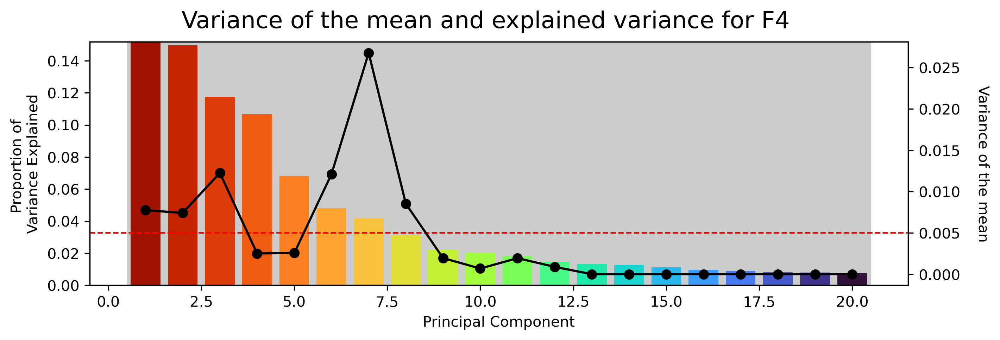

In [25]:
f, ax = plt.subplots(1, 1, figsize=(10,3), dpi=300, facecolor="white")
PC_var_exp = model_laplac_F4.explained_variance_ratio_
PC_r = np.arange(PC_var_exp.shape[0]) + 1
shuf_plot=np.zeros(PC_var_exp.shape[0])
shuf_plot[shuffling_results_F4]=np.max(PC_var_exp)
bar = ax.bar(PC_r, shuf_plot, lw=0.2, color="black", alpha=0.2, width=1)
bar = ax.bar(PC_r, PC_var_exp, lw=0.2)
cm = plt.cm.get_cmap("turbo_r")
for i in PC_r:
    plt.setp(bar[i-1],"facecolor", cm(i/20))
ax.set_xlabel("Principal Component")
ax.set_ylabel("Proportion of \nVariance Explained")
ax.set_ylim([0, PC_var_exp[0]])

ax2 = ax.twinx()
ax2.axhline(0.005, color='r', linestyle='--', lw=1)

ax2.scatter(PC_r, var_mean_F4_avg, color='k')
ax2.plot(PC_r, var_mean_F4_avg, color='k')
ax2.set_ylabel("Variance of the mean", rotation=-90, labelpad=20)
plt.suptitle("Variance of the mean and explained variance for F4", fontsize=16)

# create a variable that gives which PCs are above the 0.005 threshold
PCs_to_analyse_F4 = np.where(var_mean_F4_avg > 0.005)[0]

# convert that in 'PC_X' format
PCs_to_analyse_F4 = ["PC_{}".format(i + 1) for i in PCs_to_analyse_F4]

In [26]:
import numpy as np
from scipy.ndimage import gaussian_filter1d

def calculate_burst_rates(df_burst, exp, condition, electrode, epoch, time_bin=0.05, time_buffer=0.125):
    # Define the time range
    time_range = np.arange(-1 - time_buffer, 2 + time_buffer, time_bin)
    
    # Find the closest indices to -1 and 0 in the time_range array
    baseline_start = np.argmin(np.abs(time_range - (-0.5)))
    baseline_end = np.argmin(np.abs(time_range - (0)))

    # Filter the dataframe by 'exp' and 'condition'
    bursts = df_burst[(df_burst['experiment'] == exp) & 
                      (df_burst['condition'] == condition) & 
                      (df_burst['electrode'] == electrode) & 
                      (df_burst['epochs'] == epoch)]
    subjects = bursts['subject'].unique()

    # Create a list to store burst rates for each subject
    burst_rates = []

    for subject in subjects:
        # Initialize an array for burst rates for the current subject
        subject_burst_rates = np.zeros(len(time_range))

        subject_df = bursts[bursts['subject'] == subject]

        for i, t in enumerate(time_range):
            subject_burst_rates[i] = len(subject_df[(subject_df['peak_time'] >= t) & (subject_df['peak_time'] < t + time_bin)]) / time_bin

        subject_burst_rates_smoothed = gaussian_filter1d(subject_burst_rates, sigma=1)

        # baseline correction
        baseline_mean = np.mean(subject_burst_rates_smoothed[baseline_start:baseline_end])
        subject_burst_rates_smoothed = ((subject_burst_rates_smoothed - baseline_mean) / baseline_mean) * 100
        
        # Append the smoothed burst rates for the current subject to the list
        burst_rates.append(subject_burst_rates_smoothed)

    return burst_rates

In [27]:
time_bin = 0.025
time_buffer = 0.125
burst_rates_exp1_SS_C3_stop_Laplac = calculate_burst_rates(features_scores_laplac_C3, exp='Exp1', condition='SS', electrode = 'C3', epoch='Stop', time_bin=time_bin, time_buffer=time_buffer)
burst_rates_exp1_FS_C3_stop_Laplac = calculate_burst_rates(features_scores_laplac_C3, exp='Exp1', condition='FS', electrode = 'C3', epoch='Stop', time_bin=time_bin, time_buffer=time_buffer)
burst_rates_exp1_GO_C3_stop_Laplac = calculate_burst_rates(features_scores_laplac_C3, exp='Exp1', condition='GO', electrode = 'C3', epoch='Stop', time_bin=time_bin, time_buffer=time_buffer)

burst_rates_exp1_SS_F4_stop_Laplac = calculate_burst_rates(features_scores_laplac_F4, exp='Exp1', condition='SS', electrode = 'F4', epoch='Stop', time_bin=time_bin, time_buffer=time_buffer)
burst_rates_exp1_FS_F4_stop_Laplac = calculate_burst_rates(features_scores_laplac_F4, exp='Exp1', condition='FS', electrode = 'F4', epoch='Stop', time_bin=time_bin, time_buffer=time_buffer)
burst_rates_exp1_GO_F4_stop_Laplac = calculate_burst_rates(features_scores_laplac_F4, exp='Exp1', condition='GO', electrode = 'F4', epoch='Stop', time_bin=time_bin, time_buffer=time_buffer)


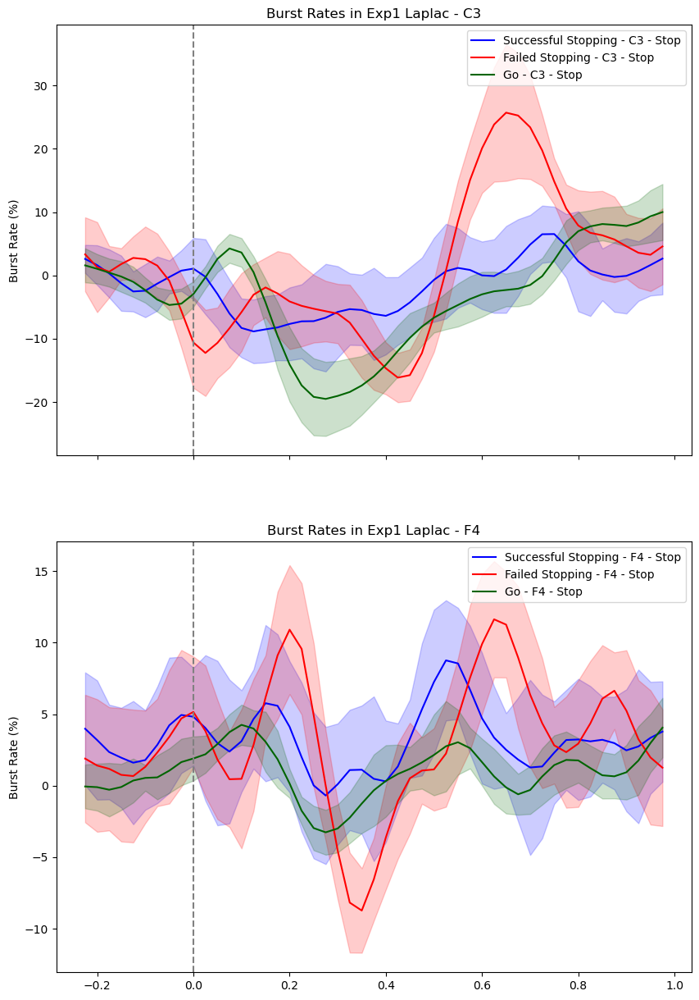

In [28]:
# Calculate mean and standard error
def calculate_mean_and_error(data):
    mean = np.mean(data, axis=0)
    std_err = np.std(data, axis=0) / np.sqrt(len(data))
    return mean, std_err

mean_burst_rates_exp1_SS_C3_stop_Laplac, std_err_burst_rates_exp1_SS_C3_stop_Laplac = calculate_mean_and_error(burst_rates_exp1_SS_C3_stop_Laplac)
mean_burst_rates_exp1_FS_C3_stop_Laplac, std_err_burst_rates_exp1_FS_C3_stop_Laplac = calculate_mean_and_error(burst_rates_exp1_FS_C3_stop_Laplac)
mean_burst_rates_exp1_SS_F4_stop_Laplac, std_err_burst_rates_exp1_SS_F4_stop_Laplac = calculate_mean_and_error(burst_rates_exp1_SS_F4_stop_Laplac)
mean_burst_rates_exp1_FS_F4_stop_Laplac, std_err_burst_rates_exp1_FS_F4_stop_Laplac = calculate_mean_and_error(burst_rates_exp1_FS_F4_stop_Laplac)
mean_burst_rates_exp1_GO_C3_stop_Laplac, std_err_burst_rates_exp1_GO_C3_stop_Laplac = calculate_mean_and_error(burst_rates_exp1_GO_C3_stop_Laplac)
mean_burst_rates_exp1_GO_F4_stop_Laplac, std_err_burst_rates_exp1_GO_F4_stop_Laplac = calculate_mean_and_error(burst_rates_exp1_GO_F4_stop_Laplac)

# Apply moving average to smooth data
def smooth_data(data, window_size=5):
    return np.convolve(data, np.ones(window_size)/window_size, mode='same')

mean_burst_rates_exp1_SS_C3_stop_Laplac = smooth_data(mean_burst_rates_exp1_SS_C3_stop_Laplac)
mean_burst_rates_exp1_FS_C3_stop_Laplac = smooth_data(mean_burst_rates_exp1_FS_C3_stop_Laplac)
mean_burst_rates_exp1_SS_F4_stop_Laplac = smooth_data(mean_burst_rates_exp1_SS_F4_stop_Laplac)
mean_burst_rates_exp1_FS_F4_stop_Laplac = smooth_data(mean_burst_rates_exp1_FS_F4_stop_Laplac)
mean_burst_rates_exp1_GO_C3_stop_Laplac = smooth_data(mean_burst_rates_exp1_GO_C3_stop_Laplac)
mean_burst_rates_exp1_GO_F4_stop_Laplac = smooth_data(mean_burst_rates_exp1_GO_F4_stop_Laplac)

# Time range and window
time_range = np.arange(-1 - 0.125, 2 + 0.125, 0.025)
time_window = np.where((time_range >= -0.250) & (time_range <= 1))[0]
start_index = time_window[0]
end_index = time_window[-1]

# Plotting
fig, axs = plt.subplots(2, 1, figsize=(10, 15), sharex=True)

# C3 Plot
axs[0].plot(time_range[start_index:end_index], mean_burst_rates_exp1_SS_C3_stop_Laplac[start_index:end_index], label='Successful Stopping - C3 - Stop', color='blue')
axs[0].fill_between(time_range[start_index:end_index], mean_burst_rates_exp1_SS_C3_stop_Laplac[start_index:end_index] - std_err_burst_rates_exp1_SS_C3_stop_Laplac[start_index:end_index], mean_burst_rates_exp1_SS_C3_stop_Laplac[start_index:end_index] + std_err_burst_rates_exp1_SS_C3_stop_Laplac[start_index:end_index], alpha=0.2, color='blue')
axs[0].plot(time_range[start_index:end_index], mean_burst_rates_exp1_FS_C3_stop_Laplac[start_index:end_index], label='Failed Stopping - C3 - Stop', color='red')
axs[0].fill_between(time_range[start_index:end_index], mean_burst_rates_exp1_FS_C3_stop_Laplac[start_index:end_index] - std_err_burst_rates_exp1_FS_C3_stop_Laplac[start_index:end_index], mean_burst_rates_exp1_FS_C3_stop_Laplac[start_index:end_index] + std_err_burst_rates_exp1_FS_C3_stop_Laplac[start_index:end_index], alpha=0.2, color='red')
axs[0].plot(time_range[start_index:end_index], mean_burst_rates_exp1_GO_C3_stop_Laplac[start_index:end_index], label='Go - C3 - Stop', color='darkgreen')
axs[0].fill_between(time_range[start_index:end_index], mean_burst_rates_exp1_GO_C3_stop_Laplac[start_index:end_index] - std_err_burst_rates_exp1_GO_C3_stop_Laplac[start_index:end_index], mean_burst_rates_exp1_GO_C3_stop_Laplac[start_index:end_index] + std_err_burst_rates_exp1_GO_C3_stop_Laplac[start_index:end_index], alpha=0.2, color='darkgreen')

axs[0].axvline(x=0, color='gray', linestyle='--')
axs[0].set_title('Burst Rates in Exp1 Laplac - C3')
axs[0].set_ylabel('Burst Rate (%)')
axs[0].legend()

# F4 Plot
axs[1].plot(time_range[start_index:end_index], mean_burst_rates_exp1_SS_F4_stop_Laplac[start_index:end_index], label='Successful Stopping - F4 - Stop', color='blue')
axs[1].fill_between(time_range[start_index:end_index], mean_burst_rates_exp1_SS_F4_stop_Laplac[start_index:end_index] - std_err_burst_rates_exp1_SS_F4_stop_Laplac[start_index:end_index], mean_burst_rates_exp1_SS_F4_stop_Laplac[start_index:end_index] + std_err_burst_rates_exp1_SS_F4_stop_Laplac[start_index:end_index], alpha=0.2, color='blue')
axs[1].plot(time_range[start_index:end_index], mean_burst_rates_exp1_FS_F4_stop_Laplac[start_index:end_index], label='Failed Stopping - F4 - Stop', color='red')
axs[1].fill_between(time_range[start_index:end_index], mean_burst_rates_exp1_FS_F4_stop_Laplac[start_index:end_index] - std_err_burst_rates_exp1_FS_F4_stop_Laplac[start_index:end_index], mean_burst_rates_exp1_FS_F4_stop_Laplac[start_index:end_index] + std_err_burst_rates_exp1_FS_F4_stop_Laplac[start_index:end_index], alpha=0.2, color='red')
axs[1].plot(time_range[start_index:end_index], mean_burst_rates_exp1_GO_F4_stop_Laplac[start_index:end_index], label='Go - F4 - Stop', color='darkgreen')
axs[1].fill_between(time_range[start_index:end_index], mean_burst_rates_exp1_GO_F4_stop_Laplac[start_index:end_index] - std_err_burst_rates_exp1_GO_F4_stop_Laplac[start_index:end_index], mean_burst_rates_exp1_GO_F4_stop_Laplac[start_index:end_index] + std_err_burst_rates_exp1_GO_F4_stop_Laplac[start_index:end_index], alpha=0.2, color='darkgreen')
axs[1].axvline(x=0, color='gray', linestyle='--')
axs[1].set_title('Burst Rates in Exp1 Laplac - F4')
axs[1].set_ylabel('Burst Rate (%)')
axs[1].legend()


plt.show()

In [29]:
import numpy as np
from scipy.ndimage import gaussian_filter1d
import pandas as pd

def calculate_burst_rates_by_pc_quartiles(df_burst, exp, condition, electrode, epoch, pc_column, time_bin=0.05, time_buffer=0.125):
    """
    Calculate and baseline correct burst rates from burst peak times within each quartile of a specified PC score.
    
    Parameters:
    df_burst (DataFrame): DataFrame containing burst information with columns ['experiment', 'condition', 'electrode', 'epochs', 'subject', 'peak_time', pc_column].
    exp (str): Experiment identifier.
    condition (str): Condition identifier.
    electrode (str): Electrode identifier.
    epoch (str): Epoch identifier.
    pc_column (str): Column name for the PC score (e.g., 'PC_1').
    time_bin (float): Time bin size in seconds (default is 0.05).
    time_buffer (float): Time buffer around the epoch in seconds (default is 0.125).

    Returns:
    dict: A dictionary where keys are quartiles (1, 2, 3, 4) and values are lists of arrays containing smoothed and baseline-corrected burst rates for each subject in that quartile.
    """
    
    # Define the time range including buffer around the epoch
    time_range = np.arange(-1 - time_buffer, 2 + time_buffer, time_bin)
    
    # Find the indices corresponding to the baseline period (-0.5 to 0 seconds)
    baseline_start = np.argmin(np.abs(time_range - (-0.5)))
    baseline_end = np.argmin(np.abs(time_range - 0))
    
    # Filter the DataFrame for the specific experiment, condition, electrode, and epoch
    bursts = df_burst[(df_burst['experiment'] == exp) & 
                      (df_burst['condition'] == condition) & 
                      (df_burst['electrode'] == electrode) & 
                      (df_burst['epochs'] == epoch)].copy()
    
    if bursts.empty:
        raise ValueError("No burst data found for the specified parameters.")
    
    # Determine quartiles for the specified PC score
    quartiles = pd.qcut(bursts[pc_column], 4, labels=False) + 1
    bursts['quartile'] = quartiles
    
    # Prepare a dictionary to store burst rates for each quartile
    burst_rates_by_quartile = {1: [], 2: [], 3: [], 4: []}

    subjects = bursts['subject'].unique()
    
    for quartile in range(1, 5):
        for subject in subjects:
            # Initialize burst rate array for the current subject
            subject_burst_rates = np.zeros(len(time_range))
            subject_df = bursts[(bursts['subject'] == subject) & (bursts['quartile'] == quartile)]

            for i, t in enumerate(time_range):
                subject_burst_rates[i] = len(subject_df[(subject_df['peak_time'] >= t) & 
                                                        (subject_df['peak_time'] < t + time_bin)]) / time_bin
            
            # Apply Gaussian smoothing to the burst rates
            subject_burst_rates_smoothed = gaussian_filter1d(subject_burst_rates, sigma=1)
            
            # Perform baseline correction
            baseline_mean = np.mean(subject_burst_rates_smoothed[baseline_start:baseline_end])
            if baseline_mean != 0:
                subject_burst_rates_smoothed = ((subject_burst_rates_smoothed - baseline_mean) / baseline_mean) * 100
            
            burst_rates_by_quartile[quartile].append(subject_burst_rates_smoothed)

    return burst_rates_by_quartile


In [30]:
data_3d = np.stack(data, axis=1)  # Stack along the third dimension
data_3d.shape

(132, 12)

Using a threshold of 3.284918
stat_fun(H1): min=0.033072 max=4.383907
Running initial clustering …
Found 2 clusters


  0%|          | Permuting : 0/9 [00:00<?,       ?it/s]

[0.3 0.6]
Using a threshold of 3.284918
stat_fun(H1): min=0.050421 max=3.942205
Running initial clustering …
Found 1 cluster


  0%|          | Permuting : 0/9 [00:00<?,       ?it/s]

[0.3]
Using a threshold of 3.284918
stat_fun(H1): min=0.011524 max=1.917438
Running initial clustering …
Found 0 clusters
[]
Using a threshold of 3.284918
stat_fun(H1): min=0.124953 max=6.251233
Running initial clustering …
Found 2 clusters


/var/folders/6s/2qfkp2515r7f660tnsjg8t440000gq/T/ipykernel_35436/2521058958.py:81: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  t_obs, clusters, cluster_p_values, _ = permutation_cluster_test(


  0%|          | Permuting : 0/9 [00:00<?,       ?it/s]

[0.2 0.2]
Using a threshold of 3.284918
stat_fun(H1): min=0.007972 max=8.219307
Running initial clustering …
Found 1 cluster


  0%|          | Permuting : 0/9 [00:00<?,       ?it/s]

[0.1]
Using a threshold of 3.284918
stat_fun(H1): min=0.000758 max=2.861628
Running initial clustering …
Found 0 clusters
[]
Using a threshold of 3.284918
stat_fun(H1): min=0.017657 max=5.745287
Running initial clustering …
Found 1 cluster


/var/folders/6s/2qfkp2515r7f660tnsjg8t440000gq/T/ipykernel_35436/2521058958.py:81: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  t_obs, clusters, cluster_p_values, _ = permutation_cluster_test(


  0%|          | Permuting : 0/9 [00:00<?,       ?it/s]

[0.1]
Using a threshold of 3.284918
stat_fun(H1): min=0.056072 max=3.665269
Running initial clustering …
Found 2 clusters


  0%|          | Permuting : 0/9 [00:00<?,       ?it/s]

[0.5 0.3]
Using a threshold of 3.284918
stat_fun(H1): min=0.008718 max=2.835423
Running initial clustering …
Found 0 clusters
[]
Using a threshold of 3.284918
stat_fun(H1): min=0.022138 max=3.233202
Running initial clustering …
Found 0 clusters
[]
Using a threshold of 3.284918
stat_fun(H1): min=0.055459 max=3.907626
Running initial clustering …
Found 1 cluster


/var/folders/6s/2qfkp2515r7f660tnsjg8t440000gq/T/ipykernel_35436/2521058958.py:81: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  t_obs, clusters, cluster_p_values, _ = permutation_cluster_test(
/var/folders/6s/2qfkp2515r7f660tnsjg8t440000gq/T/ipykernel_35436/2521058958.py:81: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  t_obs, clusters, cluster_p_values, _ = permutation_cluster_test(


  0%|          | Permuting : 0/9 [00:00<?,       ?it/s]

[0.3]
Using a threshold of 3.284918
stat_fun(H1): min=0.090892 max=7.096509
Running initial clustering …
Found 4 clusters


  0%|          | Permuting : 0/9 [00:00<?,       ?it/s]

[0.4 0.4 0.3 0.4]
Using a threshold of 3.284918
stat_fun(H1): min=0.049591 max=5.457757
Running initial clustering …
Found 1 cluster


  0%|          | Permuting : 0/9 [00:00<?,       ?it/s]

[0.1]
Using a threshold of 3.284918
stat_fun(H1): min=0.000536 max=10.047735
Running initial clustering …
Found 1 cluster


  0%|          | Permuting : 0/9 [00:00<?,       ?it/s]

[0.2]
Using a threshold of 3.284918
stat_fun(H1): min=0.022480 max=1.709915
Running initial clustering …
Found 0 clusters
[]
Using a threshold of 3.284918
stat_fun(H1): min=0.038711 max=5.697854
Running initial clustering …
Found 1 cluster


/var/folders/6s/2qfkp2515r7f660tnsjg8t440000gq/T/ipykernel_35436/2521058958.py:81: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  t_obs, clusters, cluster_p_values, _ = permutation_cluster_test(


  0%|          | Permuting : 0/9 [00:00<?,       ?it/s]

[0.7]


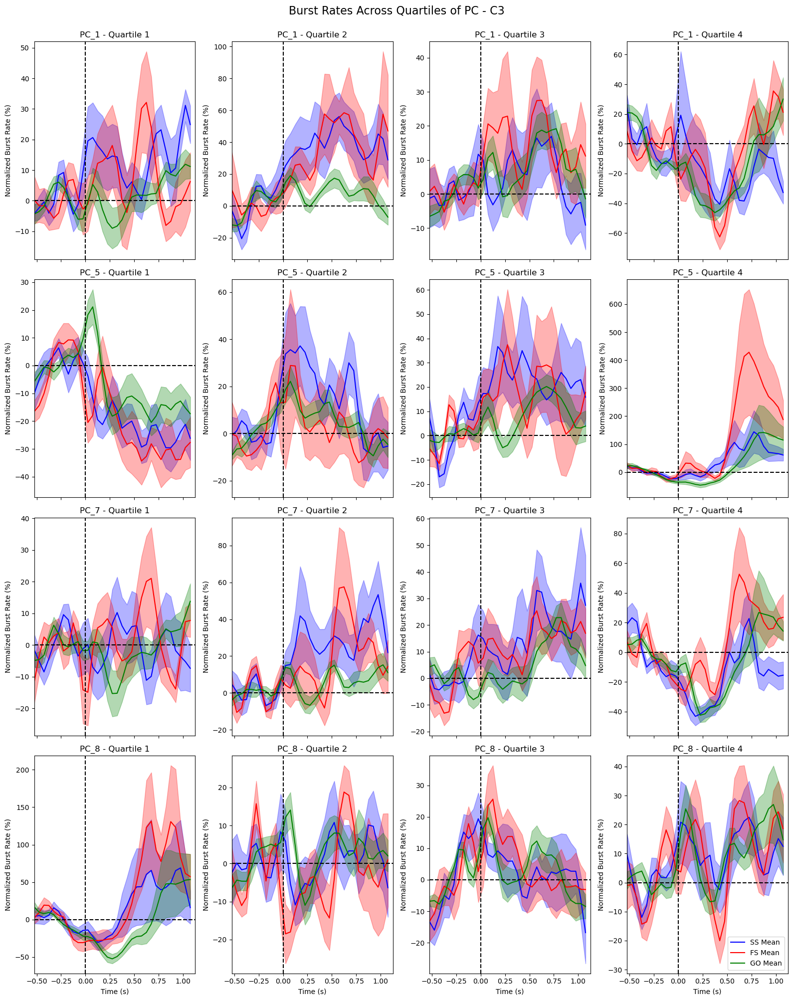

In [31]:
import numpy as np
import matplotlib.pyplot as plt
from mne.stats import permutation_cluster_test
from scipy.stats import f_oneway

p_corrected = 0.05 

# Create a single figure with subplots
fig, axes = plt.subplots(len(PCs_to_analyse_C3), 4, figsize=(16, 20), sharex='col')

time_range = np.arange(-1 - 0.125, 2 + 0.125, 0.05)
selected_time_points = time_range[12:45]

# Iterate over each PC
for pc_idx, pc  in enumerate(PCs_to_analyse_C3):
    # Calculate burst rates by quartiles for the current PC for each condition
    burst_rates_SS = calculate_burst_rates_by_pc_quartiles(
        features_scores_laplac_C3,
        exp='Exp1',
        condition='SS',
        electrode='C3',
        epoch='Stop',
        pc_column=pc
    )
    
    burst_rates_FS = calculate_burst_rates_by_pc_quartiles(
        features_scores_laplac_C3,
        exp='Exp1',
        condition='FS',
        electrode='C3',
        epoch='Stop',
        pc_column=pc
    )

    burst_rates_GO = calculate_burst_rates_by_pc_quartiles(
        features_scores_laplac_C3,
        exp='Exp1',
        condition='GO',
        electrode='C3',
        epoch='Stop',
        pc_column=pc
    )
    

    # Iterate over each quartile
    for quartile, ax in zip(range(1, 5), axes[pc_idx]):

        # Plot burst rates for SS condition
        mean_burst_rate_SS = np.mean(burst_rates_SS[quartile], axis=0)
        std_error_SS = np.std(burst_rates_SS[quartile], axis=0) / np.sqrt(len(burst_rates_SS[quartile]))
        ax.plot(time_range[12:45], mean_burst_rate_SS[12:45], label='SS Mean', color='blue')
        ax.fill_between(time_range[12:45], mean_burst_rate_SS[12:45] - std_error_SS[12:45], mean_burst_rate_SS[12:45] + std_error_SS[12:45], alpha=0.3, color='blue')
        
        # Plot burst rates for FS condition
        mean_burst_rate_FS = np.mean(burst_rates_FS[quartile], axis=0)
        std_error_FS = np.std(burst_rates_FS[quartile], axis=0) / np.sqrt(len(burst_rates_FS[quartile]))
        ax.plot(time_range[12:45], mean_burst_rate_FS[12:45], label='FS Mean', color='red')
        ax.fill_between(time_range[12:45], mean_burst_rate_FS[12:45] - std_error_FS[12:45], mean_burst_rate_FS[12:45] + std_error_FS[12:45], alpha=0.3, color='red')

        # Plot burst rates for GO condition
        mean_burst_rate_GO = np.mean(burst_rates_GO[quartile], axis=0)
        std_error_GO = np.std(burst_rates_GO[quartile], axis=0) / np.sqrt(len(burst_rates_GO[quartile]))
        ax.plot(time_range[12:45], mean_burst_rate_GO[12:45], label='GO Mean', color='green')
        ax.fill_between(time_range[12:45], mean_burst_rate_GO[12:45] - std_error_GO[12:45], mean_burst_rate_GO[12:45] + std_error_GO[12:45], alpha=0.3, color='green')
        
        ax.axvline(x=0, color='k', linestyle='--')
        ax.axhline(y=0, color='k', linestyle='--')
        ax.set_ylabel('Normalized Burst Rate (%)')
        ax.set_title(f'{pc} - Quartile {quartile}')
        ax.set_xlim(time_range[12], time_range[45])


        # Prepare data for cluster-based analysis
        burst_rates_SS_quartile = np.array(burst_rates_SS[quartile])[:, 12:45]
        burst_rates_FS_quartile = np.array(burst_rates_FS[quartile])[:, 12:45]
        burst_rates_GO_quartile = np.array(burst_rates_GO[quartile])[:, 12:45]

        data = [burst_rates_SS_quartile, burst_rates_FS_quartile, burst_rates_GO_quartile]

        # Perform cluster-based permutation F-test
        t_obs, clusters, cluster_p_values, _ = permutation_cluster_test(
            data,
            n_permutations=10,
            tail=1,  # Positive tail only (greater F-statistic)
            n_jobs=1
        )

        print(cluster_p_values)

        # Highlight significant clusters
        for cluster, p_val in zip(clusters, cluster_p_values):
            if p_val < p_corrected:
                    cluster_indices = cluster[0]
                    start, stop = cluster_indices[0], cluster_indices[-1]
                    # Ensure indices are within bounds
                    if start < len(selected_time_points) and stop < len(selected_time_points):
                        ax.axvspan(selected_time_points[start], selected_time_points[stop], color='darkorange', alpha=0.2)
                        # also print the p-value on the plot
                        ax.text(selected_time_points[start], 60, f'{p_val:.3f}', fontsize=8)
                        

# Set x-axis label for the last row of subplots
for ax in axes[-1]:
    ax.set_xlabel('Time (s)')

# Show legend only on the last subplot on a separate box
axes[-1, -1].legend(loc='lower right')

# Add a title
fig.suptitle('Burst Rates Across Quartiles of PC - C3', fontsize=16, y=1)

# Adjust layout
plt.tight_layout()
plt.show()


stat_fun(H1): min=0.041296 max=4.530322
Running initial clustering …
Found 1 cluster


  0%|          | Permuting : 0/1023 [00:00<?,       ?it/s]

stat_fun(H1): min=0.063113 max=5.904609
Running initial clustering …
Found 1 cluster


  0%|          | Permuting : 0/1023 [00:00<?,       ?it/s]

stat_fun(H1): min=0.009428 max=2.613744
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=0.285198 max=9.336147
Running initial clustering …
Found 4 clusters


/var/folders/6s/2qfkp2515r7f660tnsjg8t440000gq/T/ipykernel_35436/1919565131.py:99: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  t_obs, clusters, cluster_p_values, _ = permutation_cluster_test(


  0%|          | Permuting : 0/1023 [00:00<?,       ?it/s]

stat_fun(H1): min=0.010730 max=8.482566
Running initial clustering …
Found 2 clusters


  0%|          | Permuting : 0/1023 [00:00<?,       ?it/s]

stat_fun(H1): min=0.000748 max=6.081098
Running initial clustering …
Found 2 clusters


  0%|          | Permuting : 0/1023 [00:00<?,       ?it/s]

stat_fun(H1): min=0.031149 max=5.635211
Running initial clustering …
Found 2 clusters


  0%|          | Permuting : 0/1023 [00:00<?,       ?it/s]

stat_fun(H1): min=0.063081 max=5.390908
Running initial clustering …
Found 4 clusters


  0%|          | Permuting : 0/1023 [00:00<?,       ?it/s]

stat_fun(H1): min=0.006873 max=3.768299
Running initial clustering …
Found 1 cluster


  0%|          | Permuting : 0/1023 [00:00<?,       ?it/s]

stat_fun(H1): min=0.017136 max=7.276974
Running initial clustering …
Found 3 clusters


  0%|          | Permuting : 0/1023 [00:00<?,       ?it/s]

stat_fun(H1): min=0.081033 max=3.524304
Running initial clustering …
Found 1 cluster


  0%|          | Permuting : 0/1023 [00:00<?,       ?it/s]

stat_fun(H1): min=0.125671 max=8.814664
Running initial clustering …
Found 4 clusters


  0%|          | Permuting : 0/1023 [00:00<?,       ?it/s]

stat_fun(H1): min=0.057657 max=10.257391
Running initial clustering …
Found 2 clusters


  0%|          | Permuting : 0/1023 [00:00<?,       ?it/s]

stat_fun(H1): min=0.000533 max=8.498905
Running initial clustering …
Found 2 clusters


  0%|          | Permuting : 0/1023 [00:00<?,       ?it/s]

stat_fun(H1): min=0.026712 max=1.922926
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=0.057138 max=6.673288
Running initial clustering …
Found 2 clusters


/var/folders/6s/2qfkp2515r7f660tnsjg8t440000gq/T/ipykernel_35436/1919565131.py:99: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  t_obs, clusters, cluster_p_values, _ = permutation_cluster_test(


  0%|          | Permuting : 0/1023 [00:00<?,       ?it/s]

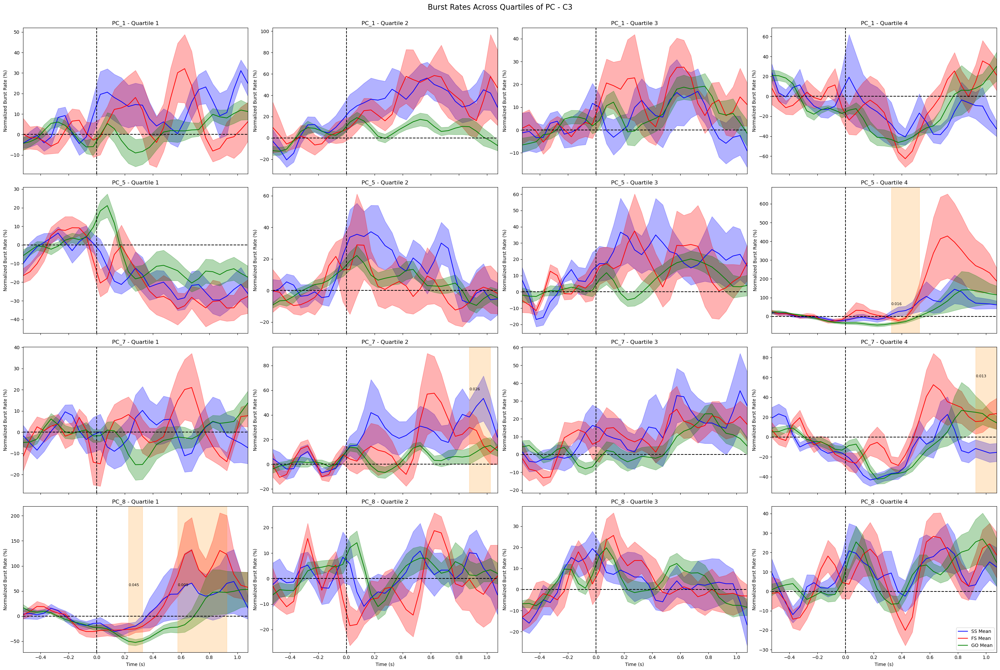

In [32]:
from mne.stats import f_mway_rm, f_threshold_mway_rm
import numpy as np
import matplotlib.pyplot as plt

def stat_fun(*args):
    return f_mway_rm(
        np.swapaxes(args, 1, 0),
        factor_levels=factor_levels,
        effects=effects,
        return_pvals=False,
    )[0]


# Define factors
n_subjects = 12
factor_levels = [3]  # Number of conditions (SS, FS, GO)
effects='A'
p_thresh = 0.05  # Significance level


# Compute F-statistics and thresholds
f_thresh = f_threshold_mway_rm(n_subjects, factor_levels, effects=effects, pvalue=p_thresh)

# Create a single figure with subplots
fig, axes = plt.subplots(len(PCs_to_analyse_C3), 4, figsize=(30, 20), sharex='col')

time_range = np.arange(-1 - 0.125, 2 + 0.125, 0.05)
selected_time_points = time_range[12:45]

# Iterate over each PC
for pc_idx, pc in enumerate(PCs_to_analyse_C3):
    # Calculate burst rates by quartiles for the current PC for each condition
    burst_rates_SS = calculate_burst_rates_by_pc_quartiles(
        features_scores_laplac_C3,
        exp='Exp1',
        condition='SS',
        electrode='C3',
        epoch='Stop',
        pc_column=pc
    )
    
    burst_rates_FS = calculate_burst_rates_by_pc_quartiles(
        features_scores_laplac_C3,
        exp='Exp1',
        condition='FS',
        electrode='C3',
        epoch='Stop',
        pc_column=pc
    )

    burst_rates_GO = calculate_burst_rates_by_pc_quartiles(
        features_scores_laplac_C3,
        exp='Exp1',
        condition='GO',
        electrode='C3',
        epoch='Stop',
        pc_column=pc
    )

    # Iterate over each quartile
    for quartile, ax in zip(range(1, 5), axes[pc_idx]):

        # Plot burst rates for SS condition
        mean_burst_rate_SS = np.mean(burst_rates_SS[quartile], axis=0)
        std_error_SS = np.std(burst_rates_SS[quartile], axis=0) / np.sqrt(len(burst_rates_SS[quartile]))
        ax.plot(selected_time_points, mean_burst_rate_SS[12:45], label='SS Mean', color='blue')
        ax.fill_between(selected_time_points, mean_burst_rate_SS[12:45] - std_error_SS[12:45], 
                         mean_burst_rate_SS[12:45] + std_error_SS[12:45], alpha=0.3, color='blue')
        
        # Plot burst rates for FS condition
        mean_burst_rate_FS = np.mean(burst_rates_FS[quartile], axis=0)
        std_error_FS = np.std(burst_rates_FS[quartile], axis=0) / np.sqrt(len(burst_rates_FS[quartile]))
        ax.plot(selected_time_points, mean_burst_rate_FS[12:45], label='FS Mean', color='red')
        ax.fill_between(selected_time_points, mean_burst_rate_FS[12:45] - std_error_FS[12:45], 
                         mean_burst_rate_FS[12:45] + std_error_FS[12:45], alpha=0.3, color='red')

        # Plot burst rates for GO condition
        mean_burst_rate_GO = np.mean(burst_rates_GO[quartile], axis=0)
        std_error_GO = np.std(burst_rates_GO[quartile], axis=0) / np.sqrt(len(burst_rates_GO[quartile]))
        ax.plot(selected_time_points, mean_burst_rate_GO[12:45], label='GO Mean', color='green')
        ax.fill_between(selected_time_points, mean_burst_rate_GO[12:45] - std_error_GO[12:45], 
                         mean_burst_rate_GO[12:45] + std_error_GO[12:45], alpha=0.3, color='green')

        ax.axvline(x=0, color='k', linestyle='--')
        ax.axhline(y=0, color='k', linestyle='--')
        ax.set_ylabel('Normalized Burst Rate (%)')
        ax.set_title(f'{pc} - Quartile {quartile}')
        ax.set_xlim(selected_time_points[0], selected_time_points[-1])

        # Prepare data for cluster-based analysis
        burst_rates_SS_quartile = np.array(burst_rates_SS[quartile])[:, 12:45]
        burst_rates_FS_quartile = np.array(burst_rates_FS[quartile])[:, 12:45]
        burst_rates_GO_quartile = np.array(burst_rates_GO[quartile])[:, 12:45]

        # Data for repeated-measures ANOVA: subjects × conditions × time points
        data = [burst_rates_SS_quartile, burst_rates_FS_quartile, burst_rates_GO_quartile]

        # Perform cluster-based permutation F-test
        t_obs, clusters, cluster_p_values, _ = permutation_cluster_test(
            data,
            threshold=f_thresh,
            stat_fun=stat_fun,
            tail=1,  
            n_jobs=1
        )
      
       # Highlight significant clusters
        for cluster, p_val in zip(clusters, cluster_p_values):
            if p_val < p_thresh:
                    cluster_indices = cluster[0]
                    start, stop = cluster_indices[0], cluster_indices[-1]
                    # Ensure indices are within bounds
                    if start < len(selected_time_points) and stop < len(selected_time_points):
                        ax.axvspan(selected_time_points[start], selected_time_points[stop], color='darkorange', alpha=0.2)
                        # also print the p-value on the plot
                        ax.text(selected_time_points[start], 60, f'{p_val:.3f}', fontsize=8)

# Set x-axis label for the last row of subplots
for ax in axes[-1]:
    ax.set_xlabel('Time (s)')

# Show legend only on the last subplot
axes[-1, -1].legend(loc='lower right')

# Add a title
fig.suptitle('Burst Rates Across Quartiles of PC - C3', fontsize=16, y=1)

# Adjust layout
plt.tight_layout()
plt.show()


stat_fun(H1): min=0.065512 max=3.631404
Running initial clustering …
Found 2 clusters


  0%|          | Permuting : 0/1023 [00:00<?,       ?it/s]

stat_fun(H1): min=0.045065 max=3.531776
Running initial clustering …
Found 2 clusters


  0%|          | Permuting : 0/1023 [00:00<?,       ?it/s]

stat_fun(H1): min=0.054849 max=2.716121
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=0.130703 max=5.096528
Running initial clustering …
Found 3 clusters


/var/folders/6s/2qfkp2515r7f660tnsjg8t440000gq/T/ipykernel_35436/4033645881.py:99: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  t_obs, clusters, cluster_p_values, _ = permutation_cluster_test(


  0%|          | Permuting : 0/1023 [00:00<?,       ?it/s]

stat_fun(H1): min=0.085436 max=4.325214
Running initial clustering …
Found 1 cluster


  0%|          | Permuting : 0/1023 [00:00<?,       ?it/s]

stat_fun(H1): min=0.013062 max=6.220863
Running initial clustering …
Found 2 clusters


  0%|          | Permuting : 0/1023 [00:00<?,       ?it/s]

stat_fun(H1): min=0.133707 max=8.464898
Running initial clustering …
Found 3 clusters


  0%|          | Permuting : 0/1023 [00:00<?,       ?it/s]

stat_fun(H1): min=0.028151 max=6.369257
Running initial clustering …
Found 2 clusters


  0%|          | Permuting : 0/1023 [00:00<?,       ?it/s]

stat_fun(H1): min=0.028906 max=3.481468
Running initial clustering …
Found 1 cluster


  0%|          | Permuting : 0/1023 [00:00<?,       ?it/s]

stat_fun(H1): min=0.045776 max=3.568692
Running initial clustering …
Found 1 cluster


  0%|          | Permuting : 0/1023 [00:00<?,       ?it/s]

stat_fun(H1): min=0.022871 max=3.434530
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=0.016912 max=6.171501
Running initial clustering …
Found 2 clusters


/var/folders/6s/2qfkp2515r7f660tnsjg8t440000gq/T/ipykernel_35436/4033645881.py:99: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  t_obs, clusters, cluster_p_values, _ = permutation_cluster_test(


  0%|          | Permuting : 0/1023 [00:00<?,       ?it/s]

stat_fun(H1): min=0.018132 max=3.029120
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=0.028699 max=3.549953
Running initial clustering …
Found 1 cluster


/var/folders/6s/2qfkp2515r7f660tnsjg8t440000gq/T/ipykernel_35436/4033645881.py:99: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  t_obs, clusters, cluster_p_values, _ = permutation_cluster_test(


  0%|          | Permuting : 0/1023 [00:00<?,       ?it/s]

stat_fun(H1): min=0.004793 max=4.195044
Running initial clustering …
Found 2 clusters


  0%|          | Permuting : 0/1023 [00:00<?,       ?it/s]

stat_fun(H1): min=0.175939 max=7.585311
Running initial clustering …
Found 4 clusters


  0%|          | Permuting : 0/1023 [00:00<?,       ?it/s]

stat_fun(H1): min=0.003188 max=1.275805
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=0.008164 max=4.841206
Running initial clustering …
Found 2 clusters


/var/folders/6s/2qfkp2515r7f660tnsjg8t440000gq/T/ipykernel_35436/4033645881.py:99: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  t_obs, clusters, cluster_p_values, _ = permutation_cluster_test(


  0%|          | Permuting : 0/1023 [00:00<?,       ?it/s]

stat_fun(H1): min=0.016817 max=2.937690
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=0.044830 max=25.018300
Running initial clustering …
Found 2 clusters


/var/folders/6s/2qfkp2515r7f660tnsjg8t440000gq/T/ipykernel_35436/4033645881.py:99: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  t_obs, clusters, cluster_p_values, _ = permutation_cluster_test(


  0%|          | Permuting : 0/1023 [00:00<?,       ?it/s]

stat_fun(H1): min=0.012657 max=3.659012
Running initial clustering …
Found 1 cluster


  0%|          | Permuting : 0/1023 [00:00<?,       ?it/s]

stat_fun(H1): min=0.001481 max=3.273411
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=0.014957 max=14.230747
Running initial clustering …
Found 2 clusters


/var/folders/6s/2qfkp2515r7f660tnsjg8t440000gq/T/ipykernel_35436/4033645881.py:99: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  t_obs, clusters, cluster_p_values, _ = permutation_cluster_test(


  0%|          | Permuting : 0/1023 [00:00<?,       ?it/s]

stat_fun(H1): min=0.006533 max=4.221233
Running initial clustering …
Found 2 clusters


  0%|          | Permuting : 0/1023 [00:00<?,       ?it/s]

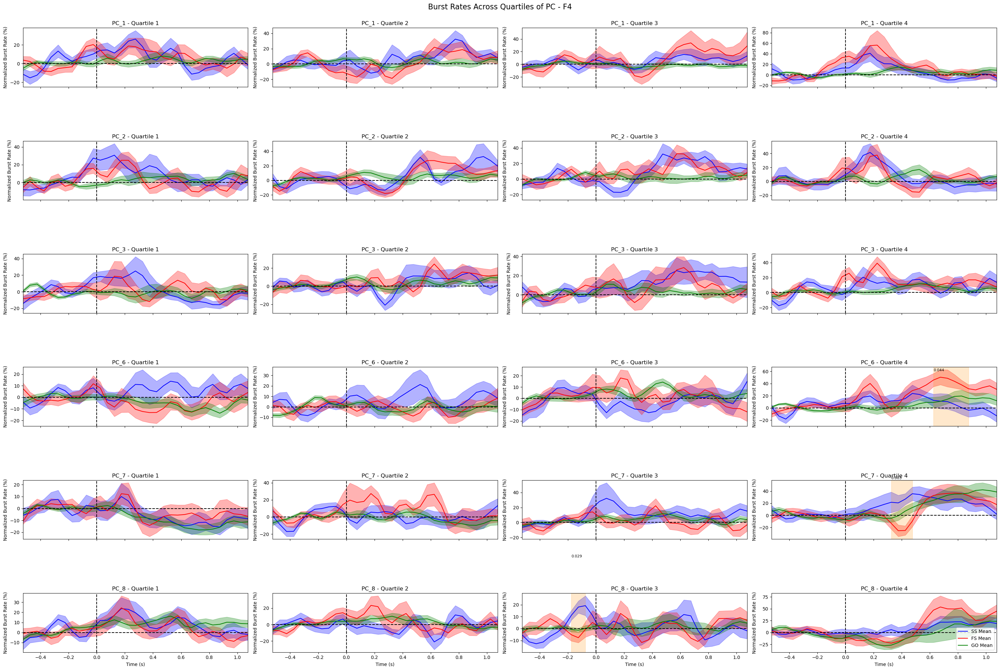

In [33]:
from mne.stats import f_mway_rm, f_threshold_mway_rm
import numpy as np
import matplotlib.pyplot as plt

def stat_fun(*args):
    return f_mway_rm(
        np.swapaxes(args, 1, 0),
        factor_levels=factor_levels,
        effects=effects,
        return_pvals=False,
    )[0]


# Define factors
n_subjects = 12
factor_levels = [3]  # Number of conditions (SS, FS, GO)
effects='A'
p_thresh = 0.05  # Significance level


# Compute F-statistics and thresholds
f_thresh = f_threshold_mway_rm(n_subjects, factor_levels, effects=effects, pvalue=p_thresh)

# Create a single figure with subplots
fig, axes = plt.subplots(len(PCs_to_analyse_F4), 4, figsize=(30, 20), sharex='col')

time_range = np.arange(-1 - 0.125, 2 + 0.125, 0.05)
selected_time_points = time_range[12:45]

# Iterate over each PC
for pc_idx, pc in enumerate(PCs_to_analyse_F4):
    # Calculate burst rates by quartiles for the current PC for each condition
    burst_rates_SS = calculate_burst_rates_by_pc_quartiles(
        features_scores_laplac_F4,
        exp='Exp1',
        condition='SS',
        electrode='F4',
        epoch='Stop',
        pc_column=pc
    )
    
    burst_rates_FS = calculate_burst_rates_by_pc_quartiles(
        features_scores_laplac_F4,
        exp='Exp1',
        condition='FS',
        electrode='F4',
        epoch='Stop',
        pc_column=pc
    )

    burst_rates_GO = calculate_burst_rates_by_pc_quartiles(
        features_scores_laplac_F4,
        exp='Exp1',
        condition='GO',
        electrode='F4',
        epoch='Stop',
        pc_column=pc
    )

    # Iterate over each quartile
    for quartile, ax in zip(range(1, 5), axes[pc_idx]):

        # Plot burst rates for SS condition
        mean_burst_rate_SS = np.mean(burst_rates_SS[quartile], axis=0)
        std_error_SS = np.std(burst_rates_SS[quartile], axis=0) / np.sqrt(len(burst_rates_SS[quartile]))
        ax.plot(selected_time_points, mean_burst_rate_SS[12:45], label='SS Mean', color='blue')
        ax.fill_between(selected_time_points, mean_burst_rate_SS[12:45] - std_error_SS[12:45], 
                         mean_burst_rate_SS[12:45] + std_error_SS[12:45], alpha=0.3, color='blue')
        
        # Plot burst rates for FS condition
        mean_burst_rate_FS = np.mean(burst_rates_FS[quartile], axis=0)
        std_error_FS = np.std(burst_rates_FS[quartile], axis=0) / np.sqrt(len(burst_rates_FS[quartile]))
        ax.plot(selected_time_points, mean_burst_rate_FS[12:45], label='FS Mean', color='red')
        ax.fill_between(selected_time_points, mean_burst_rate_FS[12:45] - std_error_FS[12:45], 
                         mean_burst_rate_FS[12:45] + std_error_FS[12:45], alpha=0.3, color='red')

        # Plot burst rates for GO condition
        mean_burst_rate_GO = np.mean(burst_rates_GO[quartile], axis=0)
        std_error_GO = np.std(burst_rates_GO[quartile], axis=0) / np.sqrt(len(burst_rates_GO[quartile]))
        ax.plot(selected_time_points, mean_burst_rate_GO[12:45], label='GO Mean', color='green')
        ax.fill_between(selected_time_points, mean_burst_rate_GO[12:45] - std_error_GO[12:45], 
                         mean_burst_rate_GO[12:45] + std_error_GO[12:45], alpha=0.3, color='green')

        ax.axvline(x=0, color='k', linestyle='--')
        ax.axhline(y=0, color='k', linestyle='--')
        ax.set_ylabel('Normalized Burst Rate (%)')
        ax.set_title(f'{pc} - Quartile {quartile}')
        ax.set_xlim(selected_time_points[0], selected_time_points[-1])

        # Prepare data for cluster-based analysis
        burst_rates_SS_quartile = np.array(burst_rates_SS[quartile])[:, 12:45]
        burst_rates_FS_quartile = np.array(burst_rates_FS[quartile])[:, 12:45]
        burst_rates_GO_quartile = np.array(burst_rates_GO[quartile])[:, 12:45]

        # Data for repeated-measures ANOVA: subjects × conditions × time points
        data = [burst_rates_SS_quartile, burst_rates_FS_quartile, burst_rates_GO_quartile]

        # Perform cluster-based permutation F-test
        t_obs, clusters, cluster_p_values, _ = permutation_cluster_test(
            data,
            threshold=f_thresh,
            stat_fun=stat_fun,
            tail=1,  
            n_jobs=1
        )
      
       # Highlight significant clusters
        for cluster, p_val in zip(clusters, cluster_p_values):
            if p_val < p_thresh:
                    cluster_indices = cluster[0]
                    start, stop = cluster_indices[0], cluster_indices[-1]
                    # Ensure indices are within bounds
                    if start < len(selected_time_points) and stop < len(selected_time_points):
                        ax.axvspan(selected_time_points[start], selected_time_points[stop], color='darkorange', alpha=0.2)
                        # also print the p-value on the plot
                        ax.text(selected_time_points[start], 60, f'{p_val:.3f}', fontsize=8)

# Set x-axis label for the last row of subplots
for ax in axes[-1]:
    ax.set_xlabel('Time (s)')

# Show legend only on the last subplot
axes[-1, -1].legend(loc='lower right')

# Add a title
fig.suptitle('Burst Rates Across Quartiles of PC - F4', fontsize=16, y=1)

# Adjust layout
plt.tight_layout()
plt.show()


stat_fun(H1): min=0.002077 max=5.190386
Running initial clustering …
Found 2 clusters


  0%|          | Permuting : 0/1023 [00:00<?,       ?it/s]

stat_fun(H1): min=0.000789 max=3.605801
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=0.000668 max=3.707430
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=0.087183 max=11.823386
Running initial clustering …
Found 3 clusters


/var/folders/6s/2qfkp2515r7f660tnsjg8t440000gq/T/ipykernel_35436/1018085530.py:99: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  t_obs, clusters, cluster_p_values, _ = permutation_cluster_test(
/var/folders/6s/2qfkp2515r7f660tnsjg8t440000gq/T/ipykernel_35436/1018085530.py:99: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  t_obs, clusters, cluster_p_values, _ = permutation_cluster_test(


  0%|          | Permuting : 0/1023 [00:00<?,       ?it/s]

stat_fun(H1): min=0.001130 max=3.058054
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=0.000807 max=8.891609
Running initial clustering …
Found 2 clusters


/var/folders/6s/2qfkp2515r7f660tnsjg8t440000gq/T/ipykernel_35436/1018085530.py:99: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  t_obs, clusters, cluster_p_values, _ = permutation_cluster_test(


  0%|          | Permuting : 0/1023 [00:00<?,       ?it/s]

stat_fun(H1): min=0.000018 max=13.174573
Running initial clustering …
Found 1 cluster


  0%|          | Permuting : 0/1023 [00:00<?,       ?it/s]

stat_fun(H1): min=0.001006 max=5.908939
Running initial clustering …
Found 2 clusters


  0%|          | Permuting : 0/1023 [00:00<?,       ?it/s]

stat_fun(H1): min=0.000230 max=5.124143
Running initial clustering …
Found 2 clusters


  0%|          | Permuting : 0/1023 [00:00<?,       ?it/s]

stat_fun(H1): min=0.022516 max=7.765025
Running initial clustering …
Found 2 clusters


  0%|          | Permuting : 0/1023 [00:00<?,       ?it/s]

stat_fun(H1): min=0.000118 max=2.767307
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=0.061959 max=9.586631
Running initial clustering …
Found 6 clusters


/var/folders/6s/2qfkp2515r7f660tnsjg8t440000gq/T/ipykernel_35436/1018085530.py:99: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  t_obs, clusters, cluster_p_values, _ = permutation_cluster_test(


  0%|          | Permuting : 0/1023 [00:00<?,       ?it/s]

stat_fun(H1): min=0.003687 max=11.769946
Running initial clustering …
Found 2 clusters


  0%|          | Permuting : 0/1023 [00:00<?,       ?it/s]

stat_fun(H1): min=0.000001 max=3.837899
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=0.000125 max=2.861749
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=0.000123 max=2.864781
Running initial clustering …
Found 0 clusters


/var/folders/6s/2qfkp2515r7f660tnsjg8t440000gq/T/ipykernel_35436/1018085530.py:99: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  t_obs, clusters, cluster_p_values, _ = permutation_cluster_test(
/var/folders/6s/2qfkp2515r7f660tnsjg8t440000gq/T/ipykernel_35436/1018085530.py:99: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  t_obs, clusters, cluster_p_values, _ = permutation_cluster_test(
/var/folders/6s/2qfkp2515r7f660tnsjg8t440000gq/T/ipykernel_35436/1018085530.py:99: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  t_obs, clusters, cluster_p_values, _ = permutation_cluster_test(


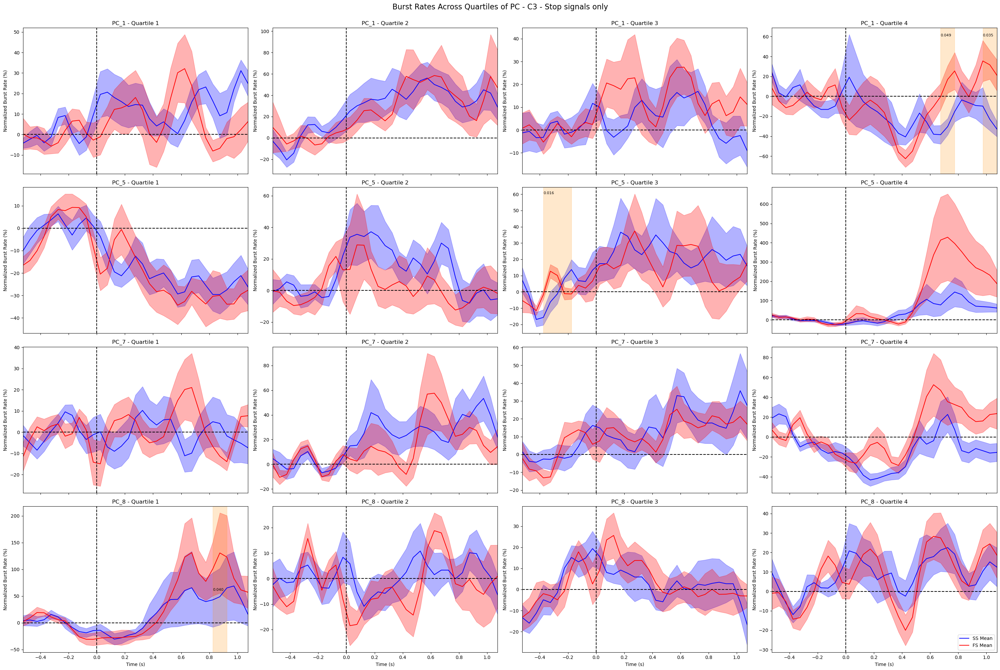

In [34]:
from mne.stats import f_mway_rm, f_threshold_mway_rm
import numpy as np
import matplotlib.pyplot as plt

def stat_fun(*args):
    return f_mway_rm(
        np.swapaxes(args, 1, 0),
        factor_levels=factor_levels,
        effects=effects,
        return_pvals=False,
    )[0]


# Define factors
n_subjects = 12
factor_levels = [2]  # Number of conditions (SS, FS, GO)
effects='A'
p_thresh = 0.05  # Significance level


# Compute F-statistics and thresholds
f_thresh = f_threshold_mway_rm(n_subjects, factor_levels, effects=effects, pvalue=p_thresh)

# Create a single figure with subplots
fig, axes = plt.subplots(len(PCs_to_analyse_C3), 4, figsize=(30, 20), sharex='col')

time_range = np.arange(-1 - 0.125, 2 + 0.125, 0.05)
selected_time_points = time_range[12:45]

# Iterate over each PC
for pc_idx, pc in enumerate(PCs_to_analyse_C3):
    # Calculate burst rates by quartiles for the current PC for each condition
    burst_rates_SS = calculate_burst_rates_by_pc_quartiles(
        features_scores_laplac_C3,
        exp='Exp1',
        condition='SS',
        electrode='C3',
        epoch='Stop',
        pc_column=pc
    )
    
    burst_rates_FS = calculate_burst_rates_by_pc_quartiles(
        features_scores_laplac_C3,
        exp='Exp1',
        condition='FS',
        electrode='C3',
        epoch='Stop',
        pc_column=pc
    )

    # burst_rates_GO = calculate_burst_rates_by_pc_quartiles(
    #     features_scores_laplac_C3,
    #     exp='Exp1',
    #     condition='GO',
    #     electrode='C3',
    #     epoch='Stop',
    #     pc_column=pc
    # )

    # Iterate over each quartile
    for quartile, ax in zip(range(1, 5), axes[pc_idx]):

        # Plot burst rates for SS condition
        mean_burst_rate_SS = np.mean(burst_rates_SS[quartile], axis=0)
        std_error_SS = np.std(burst_rates_SS[quartile], axis=0) / np.sqrt(len(burst_rates_SS[quartile]))
        ax.plot(selected_time_points, mean_burst_rate_SS[12:45], label='SS Mean', color='blue')
        ax.fill_between(selected_time_points, mean_burst_rate_SS[12:45] - std_error_SS[12:45], 
                         mean_burst_rate_SS[12:45] + std_error_SS[12:45], alpha=0.3, color='blue')
        
        # Plot burst rates for FS condition
        mean_burst_rate_FS = np.mean(burst_rates_FS[quartile], axis=0)
        std_error_FS = np.std(burst_rates_FS[quartile], axis=0) / np.sqrt(len(burst_rates_FS[quartile]))
        ax.plot(selected_time_points, mean_burst_rate_FS[12:45], label='FS Mean', color='red')
        ax.fill_between(selected_time_points, mean_burst_rate_FS[12:45] - std_error_FS[12:45], 
                         mean_burst_rate_FS[12:45] + std_error_FS[12:45], alpha=0.3, color='red')

        # # Plot burst rates for GO condition
        # mean_burst_rate_GO = np.mean(burst_rates_GO[quartile], axis=0)
        # std_error_GO = np.std(burst_rates_GO[quartile], axis=0) / np.sqrt(len(burst_rates_GO[quartile]))
        # ax.plot(selected_time_points, mean_burst_rate_GO[12:45], label='GO Mean', color='green')
        # ax.fill_between(selected_time_points, mean_burst_rate_GO[12:45] - std_error_GO[12:45], 
        #                  mean_burst_rate_GO[12:45] + std_error_GO[12:45], alpha=0.3, color='green')

        ax.axvline(x=0, color='k', linestyle='--')
        ax.axhline(y=0, color='k', linestyle='--')
        ax.set_ylabel('Normalized Burst Rate (%)')
        ax.set_title(f'{pc} - Quartile {quartile}')
        ax.set_xlim(selected_time_points[0], selected_time_points[-1])

        # Prepare data for cluster-based analysis
        burst_rates_SS_quartile = np.array(burst_rates_SS[quartile])[:, 12:45]
        burst_rates_FS_quartile = np.array(burst_rates_FS[quartile])[:, 12:45]
        # burst_rates_GO_quartile = np.array(burst_rates_GO[quartile])[:, 12:45]

        # Data for repeated-measures ANOVA: subjects × conditions × time points
        data = [burst_rates_SS_quartile, burst_rates_FS_quartile]

        # Perform cluster-based permutation F-test
        t_obs, clusters, cluster_p_values, _ = permutation_cluster_test(
            data,
            threshold=f_thresh,
            stat_fun=stat_fun,
            tail=1,  
            n_jobs=1
        )
      
       # Highlight significant clusters
        for cluster, p_val in zip(clusters, cluster_p_values):
            if p_val < p_thresh:
                    cluster_indices = cluster[0]
                    start, stop = cluster_indices[0], cluster_indices[-1]
                    # Ensure indices are within bounds
                    if start < len(selected_time_points) and stop < len(selected_time_points):
                        ax.axvspan(selected_time_points[start], selected_time_points[stop], color='darkorange', alpha=0.2)
                        # also print the p-value on the plot
                        ax.text(selected_time_points[start], 60, f'{p_val:.3f}', fontsize=8)

# Set x-axis label for the last row of subplots
for ax in axes[-1]:
    ax.set_xlabel('Time (s)')

# Show legend only on the last subplot
axes[-1, -1].legend(loc='lower right')

# Add a title
fig.suptitle('Burst Rates Across Quartiles of PC - C3 - Stop signals only', fontsize=16, y=1)

# Adjust layout
plt.tight_layout()
plt.show()


stat_fun(H1): min=0.000788 max=6.974797
Running initial clustering …
Found 2 clusters


  0%|          | Permuting : 0/1023 [00:00<?,       ?it/s]

stat_fun(H1): min=0.000934 max=4.371988
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=0.033454 max=2.149707
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=0.001252 max=4.471226
Running initial clustering …
Found 0 clusters


/var/folders/6s/2qfkp2515r7f660tnsjg8t440000gq/T/ipykernel_35436/1422064059.py:95: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  t_obs, clusters, cluster_p_values, _ = permutation_cluster_test(
/var/folders/6s/2qfkp2515r7f660tnsjg8t440000gq/T/ipykernel_35436/1422064059.py:95: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  t_obs, clusters, cluster_p_values, _ = permutation_cluster_test(
/var/folders/6s/2qfkp2515r7f660tnsjg8t440000gq/T/ipykernel_35436/1422064059.py:95: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  t_obs, clusters, cluster_p_values, _ = permutation_cluster_test(


stat_fun(H1): min=0.013686 max=2.732274
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=0.001951 max=9.873593
Running initial clustering …
Found 1 cluster


/var/folders/6s/2qfkp2515r7f660tnsjg8t440000gq/T/ipykernel_35436/1422064059.py:95: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  t_obs, clusters, cluster_p_values, _ = permutation_cluster_test(


  0%|          | Permuting : 0/1023 [00:00<?,       ?it/s]

stat_fun(H1): min=0.000360 max=4.607882
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=0.009429 max=4.157780
Running initial clustering …
Found 0 clusters


/var/folders/6s/2qfkp2515r7f660tnsjg8t440000gq/T/ipykernel_35436/1422064059.py:95: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  t_obs, clusters, cluster_p_values, _ = permutation_cluster_test(
/var/folders/6s/2qfkp2515r7f660tnsjg8t440000gq/T/ipykernel_35436/1422064059.py:95: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  t_obs, clusters, cluster_p_values, _ = permutation_cluster_test(


stat_fun(H1): min=0.000364 max=5.123417
Running initial clustering …
Found 1 cluster


  0%|          | Permuting : 0/1023 [00:00<?,       ?it/s]

stat_fun(H1): min=0.000470 max=5.231174
Running initial clustering …
Found 1 cluster


  0%|          | Permuting : 0/1023 [00:00<?,       ?it/s]

stat_fun(H1): min=0.000004 max=3.430228
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=0.011921 max=5.616529
Running initial clustering …
Found 2 clusters


/var/folders/6s/2qfkp2515r7f660tnsjg8t440000gq/T/ipykernel_35436/1422064059.py:95: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  t_obs, clusters, cluster_p_values, _ = permutation_cluster_test(


  0%|          | Permuting : 0/1023 [00:00<?,       ?it/s]

stat_fun(H1): min=0.000338 max=4.855197
Running initial clustering …
Found 1 cluster


  0%|          | Permuting : 0/1023 [00:00<?,       ?it/s]

stat_fun(H1): min=0.000016 max=4.208300
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=0.000325 max=5.944461
Running initial clustering …
Found 1 cluster


/var/folders/6s/2qfkp2515r7f660tnsjg8t440000gq/T/ipykernel_35436/1422064059.py:95: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  t_obs, clusters, cluster_p_values, _ = permutation_cluster_test(


  0%|          | Permuting : 0/1023 [00:00<?,       ?it/s]

stat_fun(H1): min=0.003842 max=10.312578
Running initial clustering …
Found 4 clusters


  0%|          | Permuting : 0/1023 [00:00<?,       ?it/s]

stat_fun(H1): min=0.000011 max=1.816712
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=0.000034 max=6.458967
Running initial clustering …
Found 1 cluster


/var/folders/6s/2qfkp2515r7f660tnsjg8t440000gq/T/ipykernel_35436/1422064059.py:95: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  t_obs, clusters, cluster_p_values, _ = permutation_cluster_test(


  0%|          | Permuting : 0/1023 [00:00<?,       ?it/s]

stat_fun(H1): min=0.008909 max=3.365991
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=0.004911 max=30.912601
Running initial clustering …
Found 1 cluster


/var/folders/6s/2qfkp2515r7f660tnsjg8t440000gq/T/ipykernel_35436/1422064059.py:95: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  t_obs, clusters, cluster_p_values, _ = permutation_cluster_test(


  0%|          | Permuting : 0/1023 [00:00<?,       ?it/s]

stat_fun(H1): min=0.000043 max=4.270715
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=0.001159 max=3.860489
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=0.017199 max=23.485830
Running initial clustering …
Found 2 clusters


/var/folders/6s/2qfkp2515r7f660tnsjg8t440000gq/T/ipykernel_35436/1422064059.py:95: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  t_obs, clusters, cluster_p_values, _ = permutation_cluster_test(
/var/folders/6s/2qfkp2515r7f660tnsjg8t440000gq/T/ipykernel_35436/1422064059.py:95: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  t_obs, clusters, cluster_p_values, _ = permutation_cluster_test(


  0%|          | Permuting : 0/1023 [00:00<?,       ?it/s]

stat_fun(H1): min=0.006488 max=6.551389
Running initial clustering …
Found 1 cluster


  0%|          | Permuting : 0/1023 [00:00<?,       ?it/s]

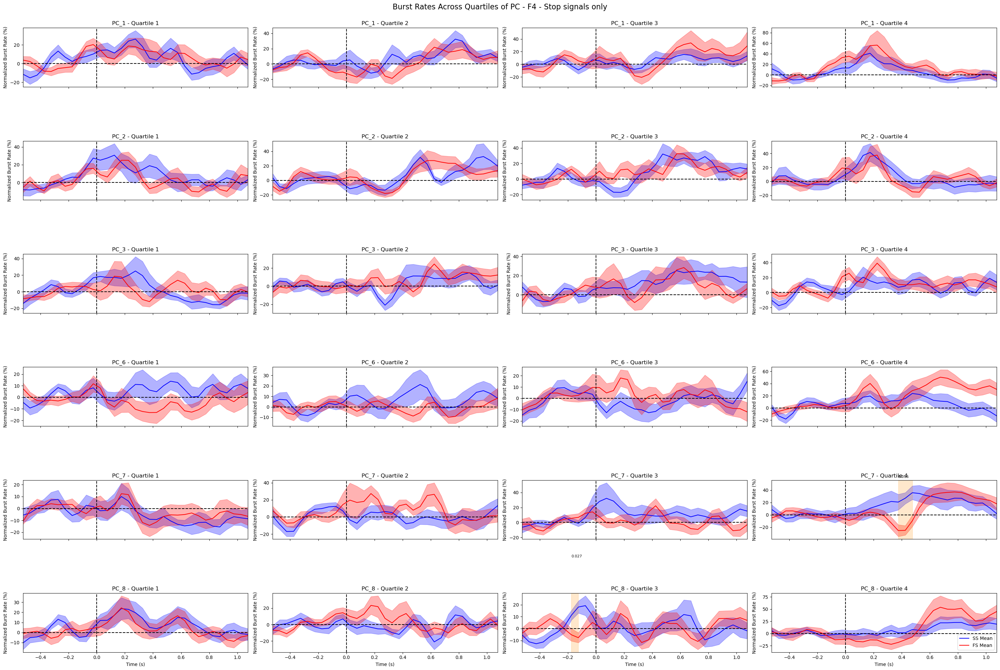

In [35]:

def stat_fun(*args):
    return f_mway_rm(
        np.swapaxes(args, 1, 0),
        factor_levels=factor_levels,
        effects=effects,
        return_pvals=False,
    )[0]


# Define factors
n_subjects = 12
factor_levels = [2]  # Number of conditions (SS, FS, GO)
effects='A'
p_thresh = 0.05  # Significance level


# Compute F-statistics and thresholds
f_thresh = f_threshold_mway_rm(n_subjects, factor_levels, effects=effects, pvalue=p_thresh)

# Create a single figure with subplots
fig, axes = plt.subplots(len(PCs_to_analyse_F4), 4, figsize=(30, 20), sharex='col')

time_range = np.arange(-1 - 0.125, 2 + 0.125, 0.05)
selected_time_points = time_range[12:45]

# Iterate over each PC
for pc_idx, pc in enumerate(PCs_to_analyse_F4):
    # Calculate burst rates by quartiles for the current PC for each condition
    burst_rates_SS = calculate_burst_rates_by_pc_quartiles(
        features_scores_laplac_F4,
        exp='Exp1',
        condition='SS',
        electrode='F4',
        epoch='Stop',
        pc_column=pc
    )
    
    burst_rates_FS = calculate_burst_rates_by_pc_quartiles(
        features_scores_laplac_F4,
        exp='Exp1',
        condition='FS',
        electrode='F4',
        epoch='Stop',
        pc_column=pc
    )

    # burst_rates_GO = calculate_burst_rates_by_pc_quartiles(
    #     features_scores_laplac_F4,
    #     exp='Exp1',
    #     condition='GO',
    #     electrode='F4',
    #     epoch='Stop',
    #     pc_column=pc
    # )

    # Iterate over each quartile
    for quartile, ax in zip(range(1, 5), axes[pc_idx]):

        # Plot burst rates for SS condition
        mean_burst_rate_SS = np.mean(burst_rates_SS[quartile], axis=0)
        std_error_SS = np.std(burst_rates_SS[quartile], axis=0) / np.sqrt(len(burst_rates_SS[quartile]))
        ax.plot(selected_time_points, mean_burst_rate_SS[12:45], label='SS Mean', color='blue')
        ax.fill_between(selected_time_points, mean_burst_rate_SS[12:45] - std_error_SS[12:45], 
                         mean_burst_rate_SS[12:45] + std_error_SS[12:45], alpha=0.3, color='blue')
        
        # Plot burst rates for FS condition
        mean_burst_rate_FS = np.mean(burst_rates_FS[quartile], axis=0)
        std_error_FS = np.std(burst_rates_FS[quartile], axis=0) / np.sqrt(len(burst_rates_FS[quartile]))
        ax.plot(selected_time_points, mean_burst_rate_FS[12:45], label='FS Mean', color='red')
        ax.fill_between(selected_time_points, mean_burst_rate_FS[12:45] - std_error_FS[12:45], 
                         mean_burst_rate_FS[12:45] + std_error_FS[12:45], alpha=0.3, color='red')

        # # Plot burst rates for GO condition
        # mean_burst_rate_GO = np.mean(burst_rates_GO[quartile], axis=0)
        # std_error_GO = np.std(burst_rates_GO[quartile], axis=0) / np.sqrt(len(burst_rates_GO[quartile]))
        # ax.plot(selected_time_points, mean_burst_rate_GO[12:45], label='GO Mean', color='green')
        # ax.fill_between(selected_time_points, mean_burst_rate_GO[12:45] - std_error_GO[12:45], 
        #                  mean_burst_rate_GO[12:45] + std_error_GO[12:45], alpha=0.3, color='green')

        ax.axvline(x=0, color='k', linestyle='--')
        ax.axhline(y=0, color='k', linestyle='--')
        ax.set_ylabel('Normalized Burst Rate (%)')
        ax.set_title(f'{pc} - Quartile {quartile}')
        ax.set_xlim(selected_time_points[0], selected_time_points[-1])

        # Prepare data for cluster-based analysis
        burst_rates_SS_quartile = np.array(burst_rates_SS[quartile])[:, 12:45]
        burst_rates_FS_quartile = np.array(burst_rates_FS[quartile])[:, 12:45]
        # burst_rates_GO_quartile = np.array(burst_rates_GO[quartile])[:, 12:45]

        # Data for repeated-measures ANOVA: subjects × conditions × time points
        data = [burst_rates_SS_quartile, burst_rates_FS_quartile]

        # Perform cluster-based permutation F-test
        t_obs, clusters, cluster_p_values, _ = permutation_cluster_test(
            data,
            threshold=f_thresh,
            stat_fun=stat_fun,
            tail=1,  
            n_jobs=1
        )
      
       # Highlight significant clusters
        for cluster, p_val in zip(clusters, cluster_p_values):
            if p_val < p_thresh:
                    cluster_indices = cluster[0]
                    start, stop = cluster_indices[0], cluster_indices[-1]
                    # Ensure indices are within bounds
                    if start < len(selected_time_points) and stop < len(selected_time_points):
                        ax.axvspan(selected_time_points[start], selected_time_points[stop], color='darkorange', alpha=0.2)
                        # also print the p-value on the plot
                        ax.text(selected_time_points[start], 60, f'{p_val:.3f}', fontsize=8)

# Set x-axis label for the last row of subplots
for ax in axes[-1]:
    ax.set_xlabel('Time (s)')

# Show legend only on the last subplot
axes[-1, -1].legend(loc='lower right')

# Add a title
fig.suptitle('Burst Rates Across Quartiles of PC - F4 - Stop signals only', fontsize=16, y=1)

# Adjust layout
plt.tight_layout()
plt.show()


In [36]:
import numpy as np

# Define function to bin spike trains
def bin_spike_trains(spike_trains, trial_numbers, bin_size, trial_length):
    binned_spike_trains = []
    for trial_num, spikes in zip(trial_numbers, spike_trains):
        spike_counts, _ = np.histogram(spikes, bins=np.arange(0, trial_length + bin_size, bin_size))
        # Include trial number as the first element of each row
        binned_spike_trains.append(np.insert(spike_counts, 0, trial_num))
    return np.array(binned_spike_trains)

# Define parameters
bin_size = 0.005  # Width of each time bin in seconds
trial_length = 1.5  # Desired length of each trial in seconds
quartiles = [0.25, 0.5, 0.75]

# Initialize a dictionary to store results
results = {}

# Loop through each principal component (PC) and subject
for pc in PCs_to_analyse_C3:
    for subject in features_scores_laplac_C3['subject'].unique():
        subject_data = features_scores_laplac_C3[features_scores_laplac_C3['subject'] == subject]

        # Compute quartiles
        quartile1 = subject_data[pc].quantile(quartiles[0])
        quartile2 = subject_data[pc].quantile(quartiles[1])
        quartile3 = subject_data[pc].quantile(quartiles[2])

        # Loop through conditions
        for condition in ['SS', 'FS', 'GO']:
            # Loop through quartiles
            for q, (lower, upper) in enumerate(
                [(None, quartile1), (quartile1, quartile2), (quartile2, quartile3), (quartile3, None)],
                start=1
            ):
                # Create a filter for the current condition and quartile
                condition_filter = (subject_data['condition'] == condition) & \
                                   (subject_data['electrode'] == 'C3') & \
                                   (subject_data['peak_time'] >= -0.5) & \
                                   (subject_data['peak_time'] <= 1)

                if lower is None:
                    condition_filter &= (subject_data[pc] < upper)
                elif upper is None:
                    condition_filter &= (subject_data[pc] >= lower)
                else:
                    condition_filter &= (subject_data[pc] >= lower) & (subject_data[pc] < upper)

                # Filter spike trains and trial numbers
                filtered_data = subject_data[condition_filter]
                spike_trains = filtered_data.groupby('trial')['peak_time'].apply(list).tolist()
                trial_numbers = filtered_data['trial'].unique()

                # Bin the spike trains with trial numbers
                binned_spike_trains = bin_spike_trains(spike_trains, trial_numbers, bin_size, trial_length)

                # Store in the results dictionary
                key = f'{condition}_q{q}_{pc}_subject_{subject}'
                results[key] = binned_spike_trains


# save results
import pickle

with open('spike_trains_C3.pkl', 'wb') as f:
    pickle.dump(results, f)



In [37]:
import numpy as np

# Define function to bin spike trains
def bin_spike_trains(spike_trains, trial_numbers, bin_size, trial_length):
    binned_spike_trains = []
    for trial_num, spikes in zip(trial_numbers, spike_trains):
        spike_counts, _ = np.histogram(spikes, bins=np.arange(0, trial_length + bin_size, bin_size))
        # Include trial number as the first element of each row
        binned_spike_trains.append(np.insert(spike_counts, 0, trial_num))
    return np.array(binned_spike_trains)

# Define parameters
bin_size = 0.005  # Width of each time bin in seconds
trial_length = 1.5  # Desired length of each trial in seconds
quartiles = [0.25, 0.5, 0.75]

# Initialize a dictionary to store results
results = {}

# Loop through each principal component (PC) and subject
for pc in PCs_to_analyse_F4:
    for subject in features_scores_laplac_F4['subject'].unique():
        subject_data = features_scores_laplac_F4[features_scores_laplac_F4['subject'] == subject]

        # Compute quartiles
        quartile1 = subject_data[pc].quantile(quartiles[0])
        quartile2 = subject_data[pc].quantile(quartiles[1])
        quartile3 = subject_data[pc].quantile(quartiles[2])

        # Loop through conditions
        for condition in ['SS', 'FS', 'GO']:
            # Loop through quartiles
            for q, (lower, upper) in enumerate(
                [(None, quartile1), (quartile1, quartile2), (quartile2, quartile3), (quartile3, None)],
                start=1
            ):
                # Create a filter for the current condition and quartile
                condition_filter = (subject_data['condition'] == condition) & \
                                   (subject_data['electrode'] == 'F4') & \
                                   (subject_data['peak_time'] >= -0.5) & \
                                   (subject_data['peak_time'] <= 1)

                if lower is None:
                    condition_filter &= (subject_data[pc] < upper)
                elif upper is None:
                    condition_filter &= (subject_data[pc] >= lower)
                else:
                    condition_filter &= (subject_data[pc] >= lower) & (subject_data[pc] < upper)

                # Filter spike trains and trial numbers
                filtered_data = subject_data[condition_filter]
                spike_trains = filtered_data.groupby('trial')['peak_time'].apply(list).tolist()
                trial_numbers = filtered_data['trial'].unique()

                # Bin the spike trains with trial numbers
                binned_spike_trains = bin_spike_trains(spike_trains, trial_numbers, bin_size, trial_length)

                # Store in the results dictionary
                key = f'{condition}_q{q}_{pc}_subject_{subject}'
                results[key] = binned_spike_trains


# save results
import pickle

with open('spike_trains_F4.pkl', 'wb') as f:
    pickle.dump(results, f)



In [38]:
# load spike trains
import pickle

with open('spike_trains_C3.pkl', 'rb') as f:
    spike_trains_C3 = pickle.load(f)

with open('spike_trains_F4.pkl', 'rb') as f:
    spike_trains_F4 = pickle.load(f)

In [39]:
spike_trains_C3['SS_q1_PC_1_subject_S1']

array([[  3,   0,   0, ...,   0,   0,   0],
       [  4,   0,   0, ...,   0,   0,   0],
       [  6,   0,   0, ...,   0,   0,   0],
       ...,
       [173,   0,   0, ...,   0,   0,   0],
       [177,   0,   0, ...,   0,   0,   0],
       [178,   0,   0, ...,   0,   0,   0]])